<h1> Amazon Apparel Recommendations </h1>



### [4.3] Overview of the data

In [1]:
#import all the necessary packages.

from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
# we have a json file which consists of all information about the products.
# loading the data using pandas' read_json file.
data = pd.read_json('tops_fashion.json')

In [0]:
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 19


### Terminology:
What is a dataset? <br>
Rows and columns <br>
Data-point <br>
Feature/variable <br>







In [0]:
# each product/item has 19 features in the raw dataset.
data.columns # prints column-names or feature-names.

Index(['asin', 'author', 'availability', 'availability_type', 'brand', 'color',
       'editorial_reivew', 'editorial_review', 'formatted_price',
       'large_image_url', 'manufacturer', 'medium_image_url', 'model',
       'product_type_name', 'publisher', 'reviews', 'sku', 'small_image_url',
       'title'],
      dtype='object')

### Of these 19 features, we will be using only 7 features in this Project.
    1. asin  ( Amazon standard identification number )
    2. brand ( brand to which the product belongs to )
    3. color ( Color information of apparel, it can contain many colors as a value ex: red and black stripes ) 
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url ( url of the image )
    6. title (title of the product.)
    7. formatted_price (price of the product)

In [0]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [0]:
print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head() # prints the top rows in the table.

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


### [5.1] Missing data for various features.

####  Basic stats for the feature: product_type_name

In [0]:
# We have total 72 unique type of product_type_names
print(data['product_type_name'].describe())

# 91.62% (167794/183138) of the products are shirts,


count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object


In [0]:
# names of different product types
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [0]:
# find the 10 most frequent product_type_names.
product_type_count = Counter(list(data['product_type_name']))
product_type_count.most_common(10)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425)]

####  Basic stats for the feature: brand

In [0]:
# there are 10577 unique brands
print(data['brand'].describe())

# 183138 - 182987 = 151 missing values.

count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object


In [0]:
brand_count = Counter(list(data['brand']))
brand_count.most_common(10)

[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187)]

####  Basic stats for the feature: color

In [0]:

print(data['color'].describe())


# we have 7380 unique colors
# 7.2% of products are black in color
# 64956 of 183138 products have brand information. That's approx 35.4%.

count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [0]:
color_count = Counter(list(data['color']))
color_count.most_common(10)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203)]

####  Basic stats for the feature: formatted_price

In [0]:
 
print(data['formatted_price'].describe())

# Only 28,395 (15.5% of whole data) products with price information

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [0]:
price_count = Counter(list(data['formatted_price']))
price_count.most_common(10)

[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336)]

#### Basic stats for the feature: title


In [0]:
print(data['title'].describe())

# All of the products have a title. 
# Titles are fairly descriptive of what the product is. 

count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object


In [0]:
data.to_pickle('pickels/180k_apparel_data')

   We save data files at every major step in our processing in "pickle" files.

In [0]:
# consider products which have price information
# data['formatted_price'].isnull() => gives the information 
#about the dataframe row's which have null values price == None|Null
data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

Number of data points After eliminating price=NULL : 28395


In [0]:
# consider products which have color information
# data['color'].isnull() => gives the information about the dataframe row's which have null values price == None|Null
data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

Number of data points After eliminating color=NULL : 28385


#### We brought down the number of data points from 183K  to 28K.

We are processing only 28K points so that we can run this code on our laptops in a reasonable amount of time. <br>
Because My laptop is very low end laptop.

In [0]:
data.to_pickle('pickels/28k_apparel_data')

### [5.2] Remove near duplicate items

#### [5.2.1] Understand about duplicates.

In [0]:
# read data from pickle file from previous stage
data = pd.read_pickle('pickels/28k_apparel_data')

# find number of products that have duplicate titles.
print(sum(data.duplicated('title')))
# we have 2325 products which have same title but different color

2325


#### In our data there are many duplicate products, we need to de-dupe them for better results.


#### [5.2.2] Remove duplicates : Part 1

In [0]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Ladies Cotton Tank 2x1 Ribbed Tank Top,$11.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54
21,B014ICEDNA,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,Supernatural Chibis Sam Dean And Castiel Short...,$7.50


In [0]:
# Remove All products with very few words in title
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [0]:
# Sort the whole data based on title (alphabetical order of title) 
data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


#### Some examples of dupliacte titles that differ only in the last few words.

<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

Title 3:
61. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
62. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
63. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
64. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
</pre>

In [0]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [0]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = data['title'].loc[indices[i]].split()

    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = data['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])


            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [0]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]

#### We removed  the dupliactes which differ only at the end.

In [0]:
print('Number of data points : ', data.shape[0])

Number of data points :  17593


In [0]:
data.to_pickle('pickels/17k_apperal_data')

#### [5.2.3] Remove duplicates : Part 2

<pre>

In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt

</pre>

In [0]:
data = pd.read_pickle('pickels/17k_apperal_data')

In [0]:
# This code snippet takes significant amount of time.
# O(n^2) time.
# Takes about hours to run on a decent computer.

indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
    # consider the first apperal's title
    a = data['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:
        
        b = data['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
        
        length = max(len(a),len(b))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)

In [0]:
# from whole previous products we will consider only 
# the products that are found in previous cell 
data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [0]:
print('Number of data points after stage two of dedupe: ',data.shape[0])
# from 17k apperals we reduced to 16k apperals

Number of data points after stage two of dedupe:  16042


In [0]:
data.to_pickle('pickels/16k_apperal_data')
# Storing these products in a pickle file
# candidates who wants to download these files instead 
# of 180K they can download and use them from the Google Drive folder.

# 6. Text pre-processing

In [0]:
data = pd.read_pickle('pickels/16k_apperal_data')

# NLTK download stop words. [RUN ONLY ONCE]
# goto Terminal (Linux/Mac) or Command-Prompt (Window) 
# In the temrinal, type these commands
# $python3
# $import nltk
# $nltk.download()

In [0]:
# we use the list of stop words that are downloaded from nltk lib.
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {'such', 'and', 'hers', 'up', 'she', 'd', 'further', 'all', 'than', 'under', 'is', 'off', 'both', 'most', 'few', 'should', 're', 'very', 'just', 'then', 'didn', 'myself', 'in', 'too', 's', 'shouldn', 'herself', 'because', 'how', 'itself', 'what', 'shan', 'weren', 'doing', 'them', 'couldn', 'their', 'so', 'ain', 'haven', 'yourself', 'now', 'll', 'isn', 'about', 'over', 'into', 'before', 'during', 'on', 'as', 'aren', 'against', 'above', 'down', 'they', 'below', 'me', 'again', 'for', 'why', 'been', 'yourselves', 'more', 'her', 'that', 'can', 'am', 'was', 'themselves', 'mightn', 'does', 'those', 'only', 'hasn', 'any', 'ma', 'are', 'nor', 'out', 'you', 'ourselves', 'the', 'an', 'has', 'where', 'i', 'while', 'ours', 'its', 'your', 'had', 'were', 'being', 'no', 'or', 'needn', 've', 'y', 'a', 'each', 'have', 'through', 'when', 'mustn', 'by', 'won', 'from', 'own', 'will', 'there', 't', 'him', 'these', 'doesn', 'theirs', 'my', 'did', 'of', 'who', 'until', 'wouldn', 'we', 'do'

In [0]:
start_time = time.clock()
# we take each title and we text-preprocess it.
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
# we print the time it took to preprocess whole titles 
print(time.clock() - start_time, "seconds")

3.5727220000000006 seconds


In [0]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [0]:
data.to_pickle('pickels/16k_apperal_data_preprocessed')

## Stemming 

In [0]:
from nltk.stem.porter import *
stemmer = PorterStemmer()
print(stemmer.stem('arguing'))
print(stemmer.stem('fishing'))

# We tried using stemming on our titles and it didnot work very well. 

argu
fish


# [8] Text based product similarity

In [3]:
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [0]:
# Utility Functions which we will use.
#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
  
#plotting code to understand the algorithm's decision.
def plot_heatmap(keys, values, labels, url, text):
        # keys: list of words of recommended title
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        # displays combine figure ( heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models, 
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]
    
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


# this function gets a list of wrods along with the frequency of each 
# word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}



def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

## [8.2] Bag of Words (BoW) on product titles.

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape() # get number of rows and columns in feature matrix.
# title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(corpus) returns 
# the a sparase matrix of dimensions #data_points * #words_in_corpus

# What is a sparse vector?

# title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

(16042, 12609)

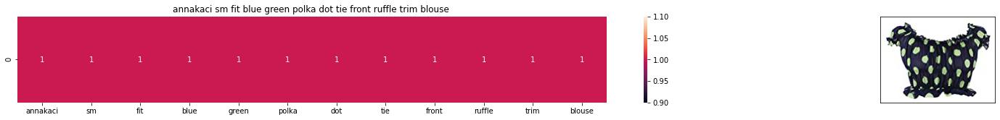

ASIN : B00KLHUIBS
Brand: Anna-Kaci
Title: annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean similarity with the query image : 0.0


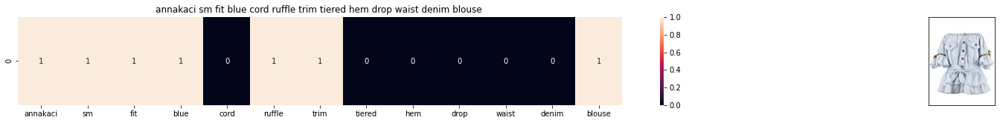

ASIN : B0759G15ZX
Brand: Anna-Kaci
Title: annakaci sm fit blue cord ruffle trim tiered hem drop waist denim blouse 
Euclidean similarity with the query image : 3.3166247903554


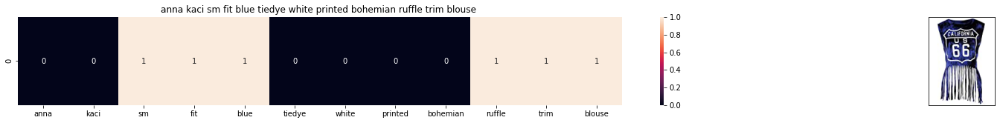

ASIN : B00YQ8S4K0
Brand: Anna-Kaci
Title: anna kaci sm fit blue tiedye white printed bohemian ruffle trim blouse 
Euclidean similarity with the query image : 3.4641016151377544


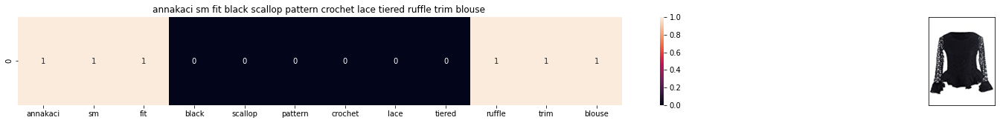

ASIN : B00O194W8W
Brand: Anna-Kaci
Title: annakaci sm fit black scallop pattern crochet lace tiered ruffle trim blouse 
Euclidean similarity with the query image : 3.4641016151377544


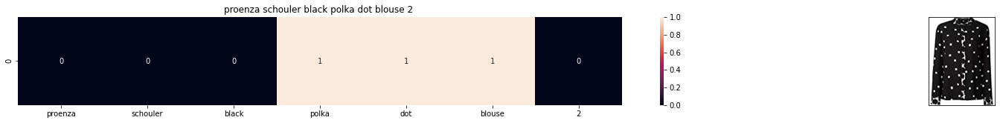

ASIN : B074TLHLMN
Brand: Proenza Schouler
Title: proenza schouler black polka dot blouse 2 
Euclidean similarity with the query image : 3.4641016151377544


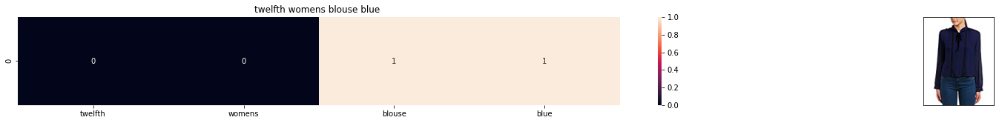

ASIN : B074F5BP5F
Brand: On Twelfth
Title: twelfth womens blouse blue 
Euclidean similarity with the query image : 3.4641016151377544


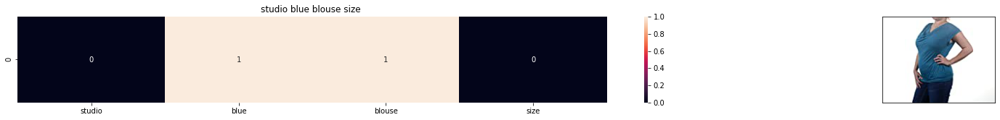

ASIN : B016P80OKQ
Brand: Studio M
Title: studio blue blouse size 
Euclidean similarity with the query image : 3.4641016151377544


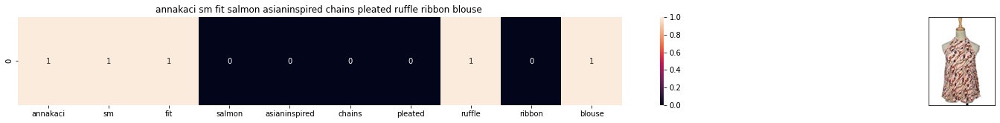

ASIN : B007KSG42S
Brand: Anna-Kaci
Title: annakaci sm fit salmon asianinspired chains pleated ruffle ribbon blouse 
Euclidean similarity with the query image : 3.4641016151377544


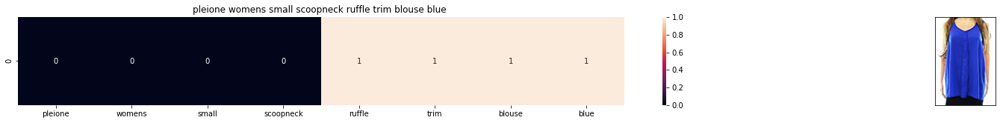

ASIN : B072VHTT1D
Brand: Pleione
Title: pleione womens small scoopneck ruffle trim blouse blue 
Euclidean similarity with the query image : 3.4641016151377544


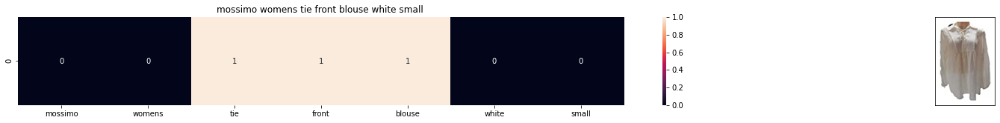

ASIN : B07111HHX6
Brand: Mossimo
Title: mossimo womens tie front blouse white small 
Euclidean similarity with the query image : 3.605551275463989


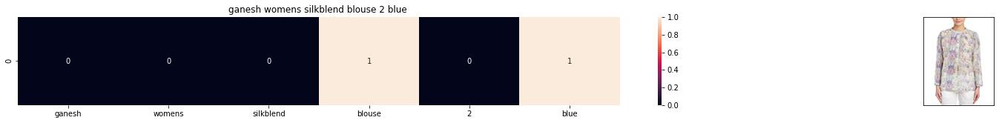

ASIN : B01N3SAT1F
Brand: Ganesh
Title: ganesh womens silkblend blouse 2 blue 
Euclidean similarity with the query image : 3.605551275463989


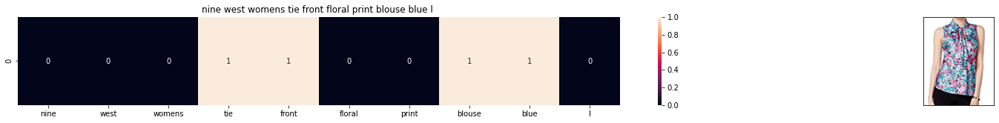

ASIN : B06WW5C6NJ
Brand: Nine West
Title: nine west womens tie front floral print blouse blue l 
Euclidean similarity with the query image : 3.605551275463989


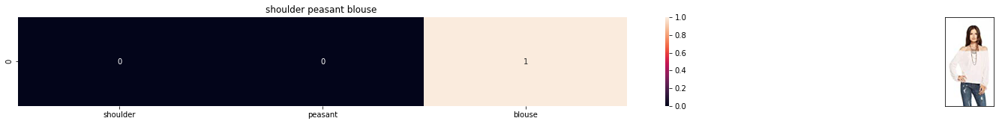

ASIN : B01E1QD5PK
Brand: CHASER
Title: shoulder peasant blouse 
Euclidean similarity with the query image : 3.605551275463989


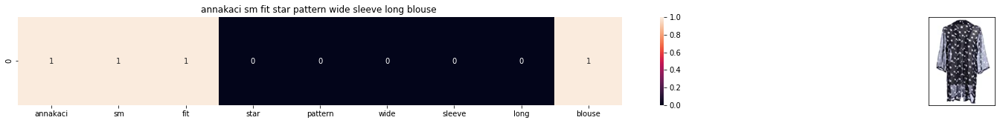

ASIN : B00G5RYY18
Brand: Anna-Kaci
Title: annakaci sm fit star pattern wide sleeve long blouse 
Euclidean similarity with the query image : 3.605551275463989


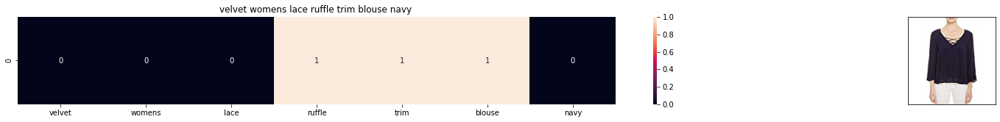

ASIN : B06XCZGQLP
Brand: Velvet by Graham & Spencer
Title: velvet womens lace ruffle trim blouse navy 
Euclidean similarity with the query image : 3.605551275463989


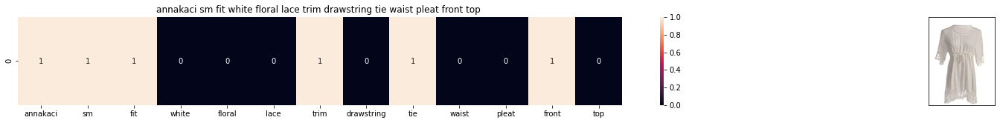

ASIN : B00DW1NKSS
Brand: Anna-Kaci
Title: annakaci sm fit white floral lace trim drawstring tie waist pleat front top 
Euclidean similarity with the query image : 3.605551275463989


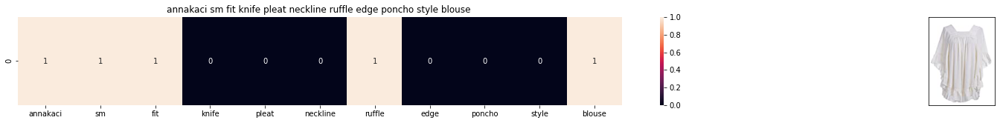

ASIN : B00HCNNOJW
Brand: Anna-Kaci
Title: annakaci sm fit knife pleat neckline ruffle edge poncho style blouse 
Euclidean similarity with the query image : 3.605551275463989


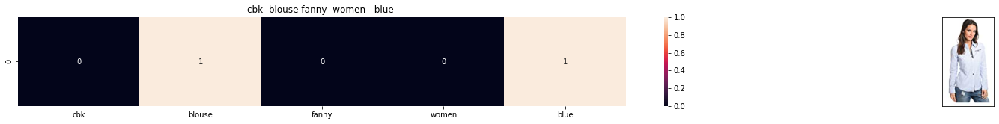

ASIN : B071NDX99J
Brand: CBK
Title: cbk  blouse fanny  women   blue 
Euclidean similarity with the query image : 3.605551275463989


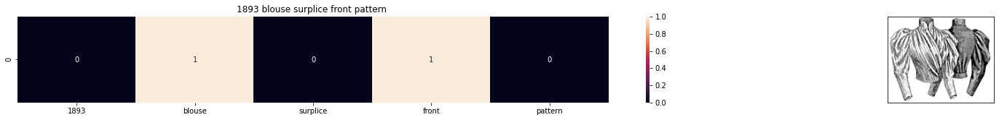

ASIN : B00886YXL0
Brand: Ageless Patterns
Title: 1893 blouse surplice front pattern 
Euclidean similarity with the query image : 3.605551275463989


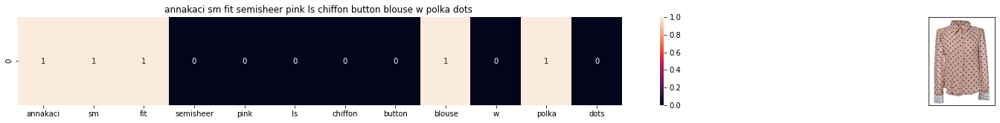

ASIN : B008Z5ST3C
Brand: Anna-Kaci
Title: annakaci sm fit semisheer pink ls chiffon button blouse w polka dots 
Euclidean similarity with the query image : 3.605551275463989


In [0]:
def bag_of_words_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus.
    # pairwise_dist will store the distance from given input apparel to all remaining apparels.
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity.
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    # np.argsort will return indices of the smallest distances.
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    
    # pdists will store the smallest distances.
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    # data frame indices of the 9 smallest distace's.
    df_indices = list(data.index[indices])
    
    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model.
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)

# call the bag-of-words model for a product to get similar products.
bag_of_words_model(931, 20) # change the index if you want to.
# In the output heat map each value represents the count value. 
# of the label word, the color represents the intersection. 
# with inputs title.

# try 12566
# try 931

## [8.5] TF-IDF based product similarity

In [0]:
tfidf_title_vectorizer = TfidfVectorizer(min_df = 0)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])
# tfidf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus

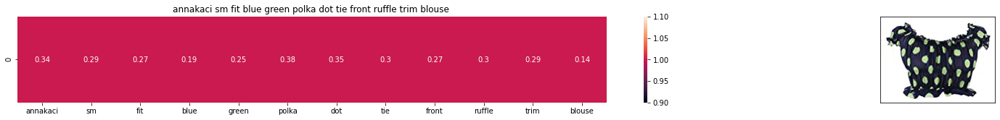

ASIN : B00KLHUIBS
BRAND : Anna-Kaci
Eucliden distance from the given image : 0.0


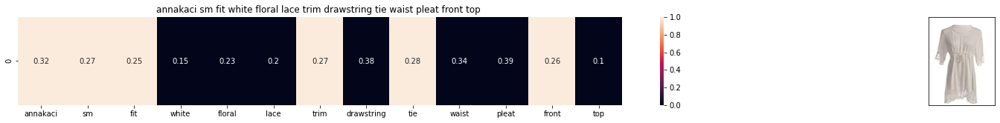

ASIN : B00DW1NKSS
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0095030470167985


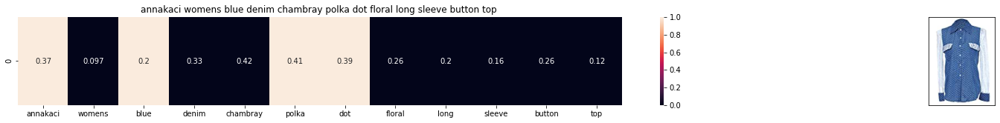

ASIN : B008SMIFN6
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0417985120306879


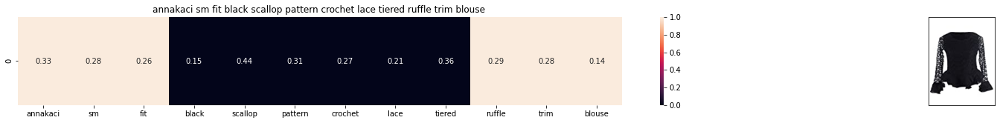

ASIN : B00O194W8W
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0459904789057266


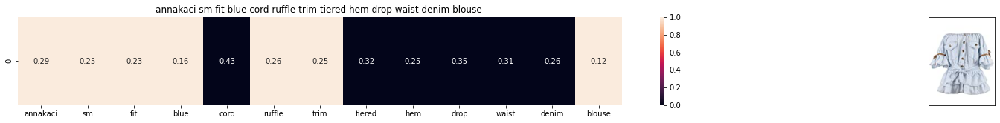

ASIN : B0759G15ZX
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0670382891349646


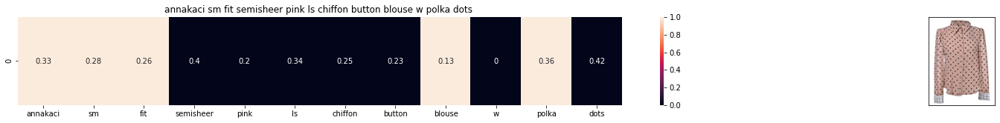

ASIN : B008Z5ST3C
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0791943428312727


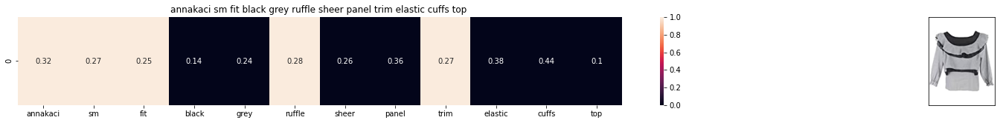

ASIN : B00OIBU11K
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0810642547494655


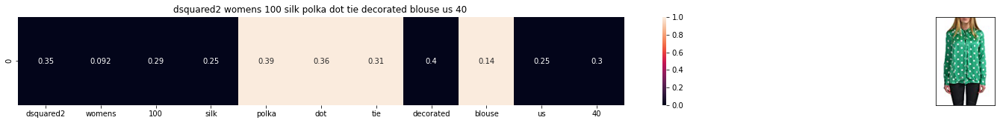

ASIN : B01AYBH28M
BRAND : DSQUARED2
Eucliden distance from the given image : 1.1040520792000037


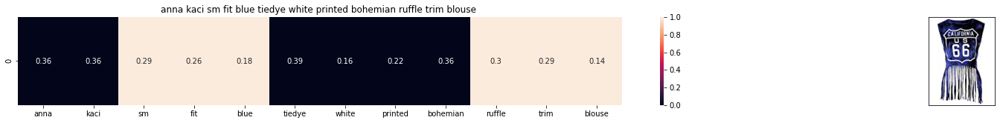

ASIN : B00YQ8S4K0
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1106318669558235


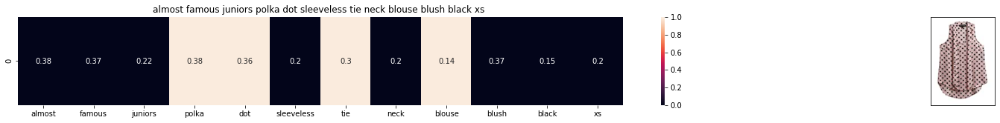

ASIN : B0745J9HNS
BRAND : Almost Famous
Eucliden distance from the given image : 1.1114784382103977


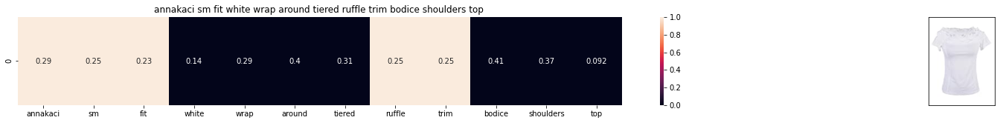

ASIN : B00LMKGFS8
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.113963394862801


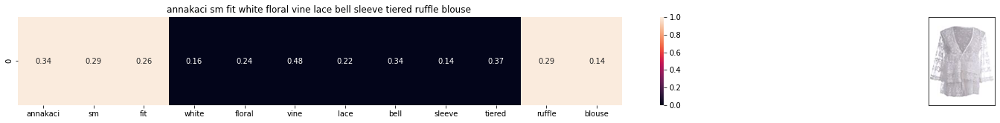

ASIN : B00DVOAWM8
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.115670616192694


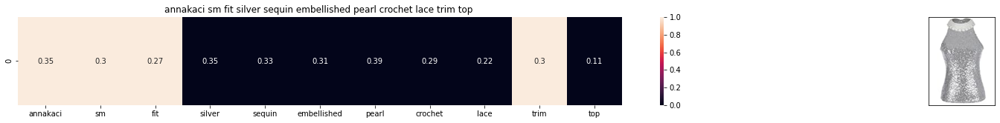

ASIN : B00OPFYBXI
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1246975675554733


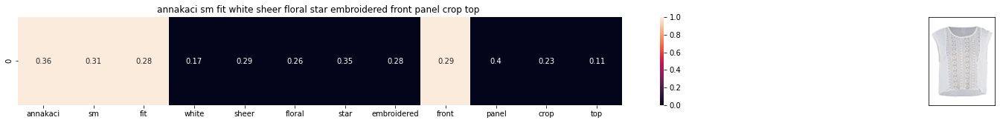

ASIN : B00NAB1R8A
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.124773884923174


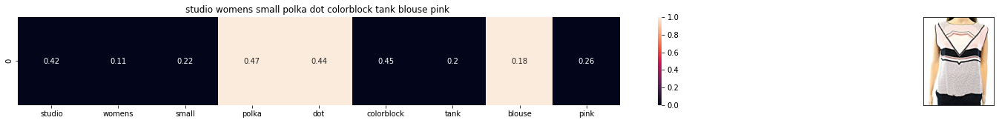

ASIN : B0721KC2HT
BRAND : Studio M
Eucliden distance from the given image : 1.129816389682597


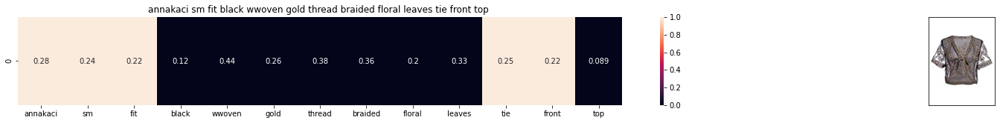

ASIN : B00E7Z8DWQ
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.13146940297404


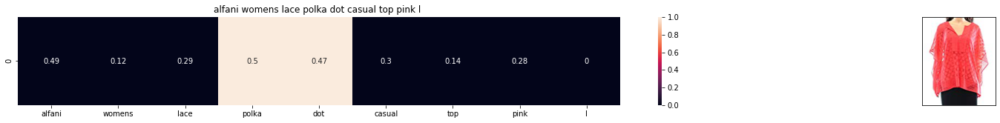

ASIN : B07125NJJ2
BRAND : Alfani
Eucliden distance from the given image : 1.1325545037426967


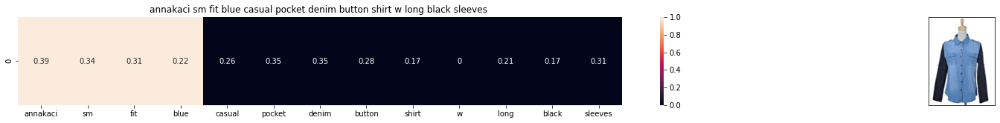

ASIN : B0097LQOOY
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.134493010198643


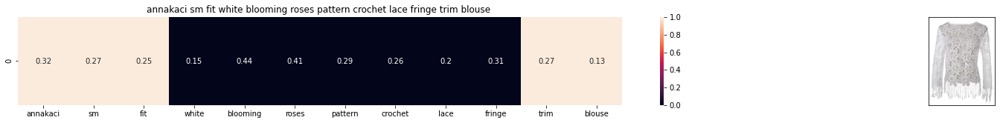

ASIN : B00RDLAR2A
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1394888920467072


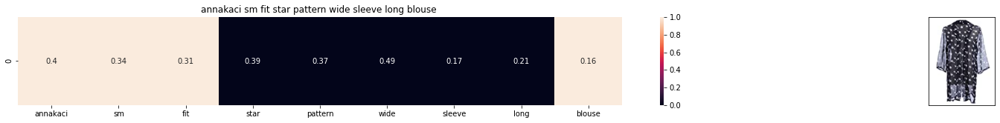

ASIN : B00G5RYY18
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1474660726278398


In [0]:
def tfidf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        print('='*125)
tfidf_model(931, 20)
# in the output heat map each value represents the tfidf values of the label word, the color represents the intersection with inputs title

# [9] Text Semantics based product similarity

In [0]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

# in this project we are using a pretrained model by google.
model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)

In [0]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [0]:
# vocab = stores all the words that are there in google w2v model
# vocab = model.wv.vocab.keys() # if you are using Google word2Vec

vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

### [9.2] Average Word2Vec product similarity.

In [0]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)

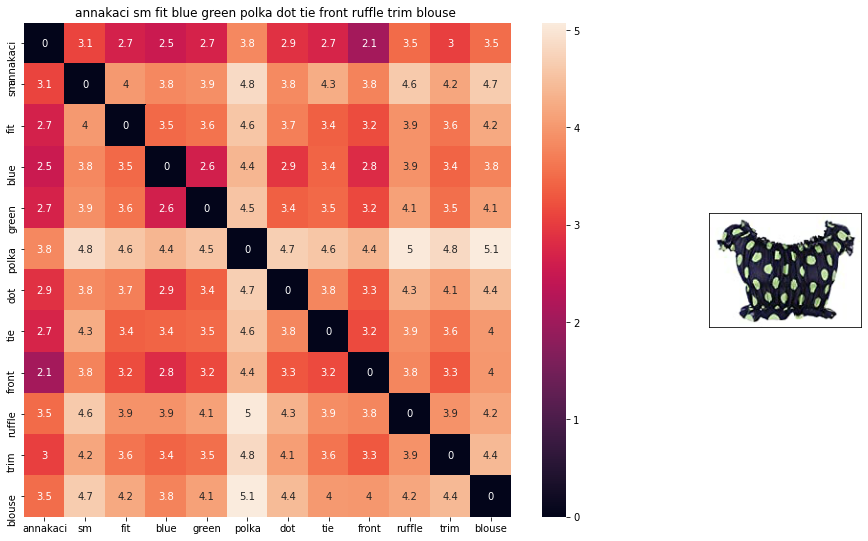

ASIN : B00KLHUIBS
BRAND : Anna-Kaci
euclidean distance from given input image : 0.0


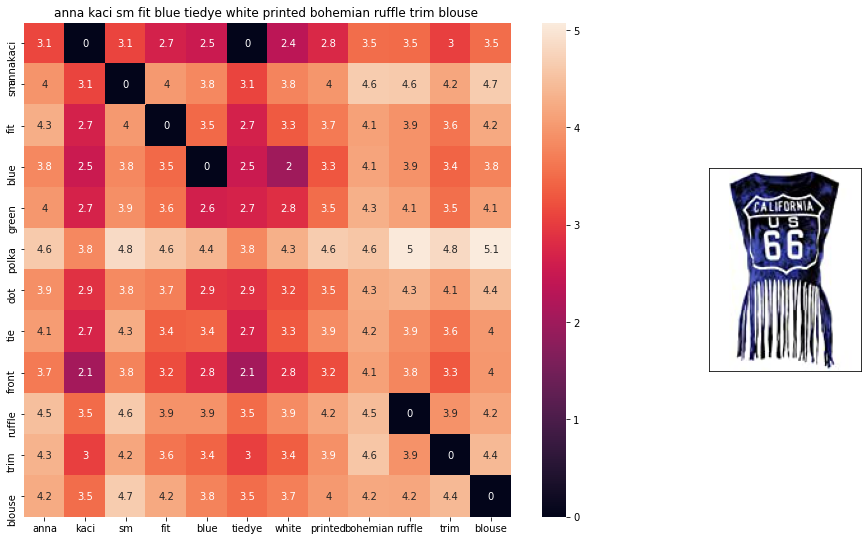

ASIN : B00YQ8S4K0
BRAND : Anna-Kaci
euclidean distance from given input image : 0.66906893


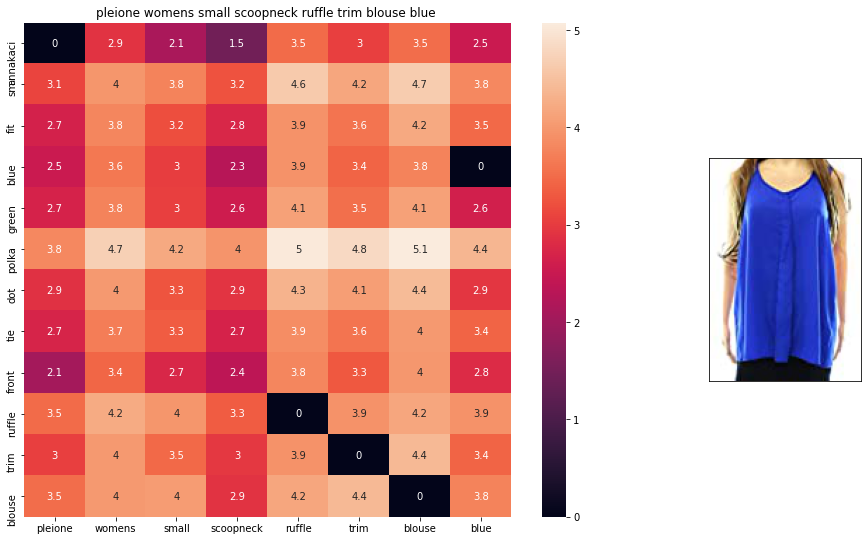

ASIN : B072VHTT1D
BRAND : Pleione
euclidean distance from given input image : 0.7917671


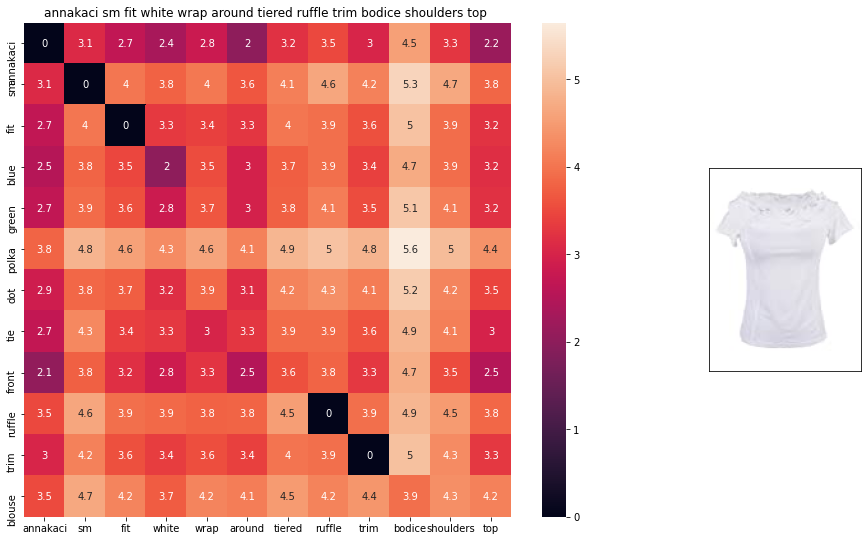

ASIN : B00LMKGFS8
BRAND : Anna-Kaci
euclidean distance from given input image : 0.8094231


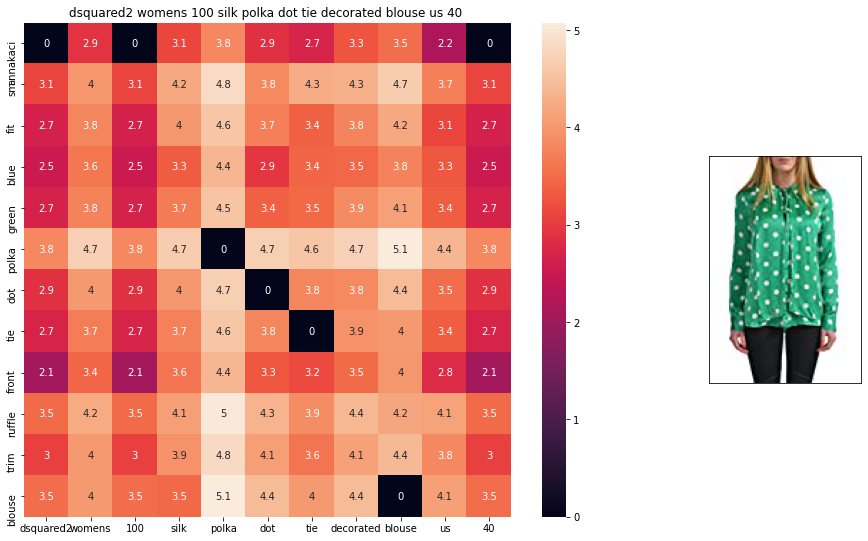

ASIN : B01AYBH28M
BRAND : DSQUARED2
euclidean distance from given input image : 0.81274205


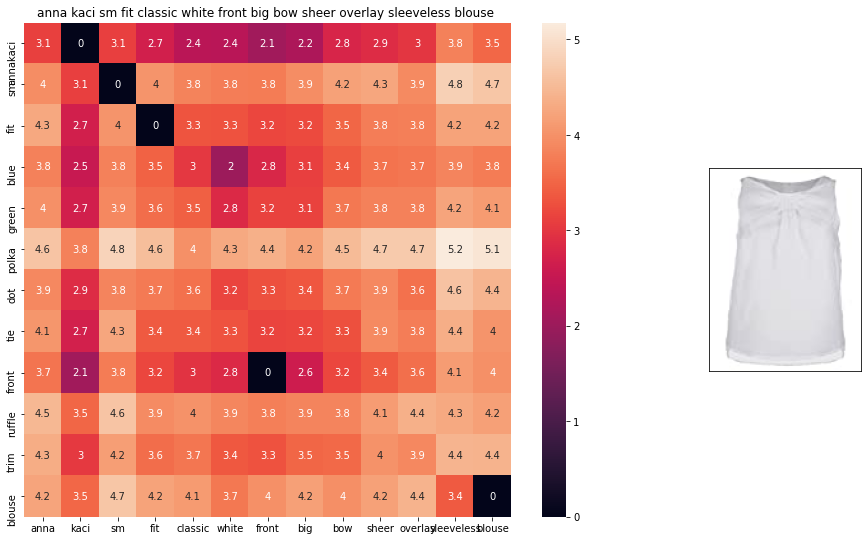

ASIN : B010EH3S02
BRAND : Anna-Kaci
euclidean distance from given input image : 0.81881666


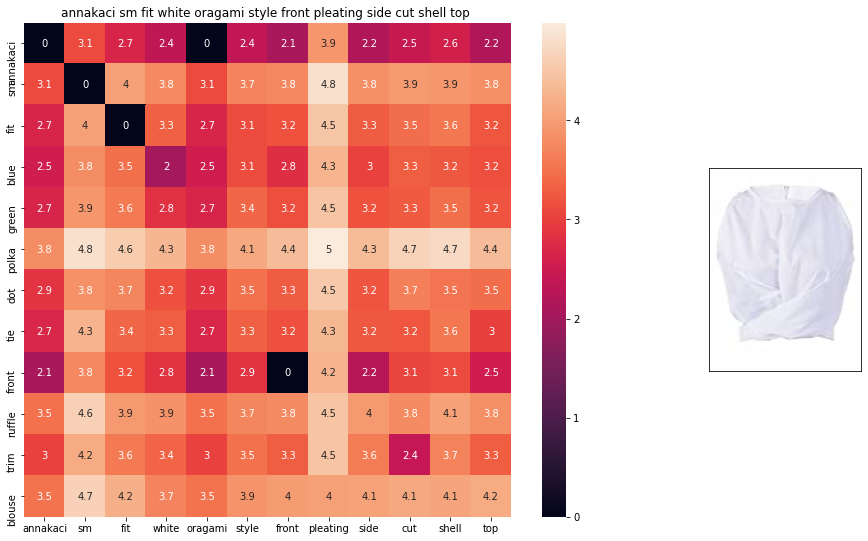

ASIN : B00LU4Z2YY
BRAND : Anna-Kaci
euclidean distance from given input image : 0.81900114


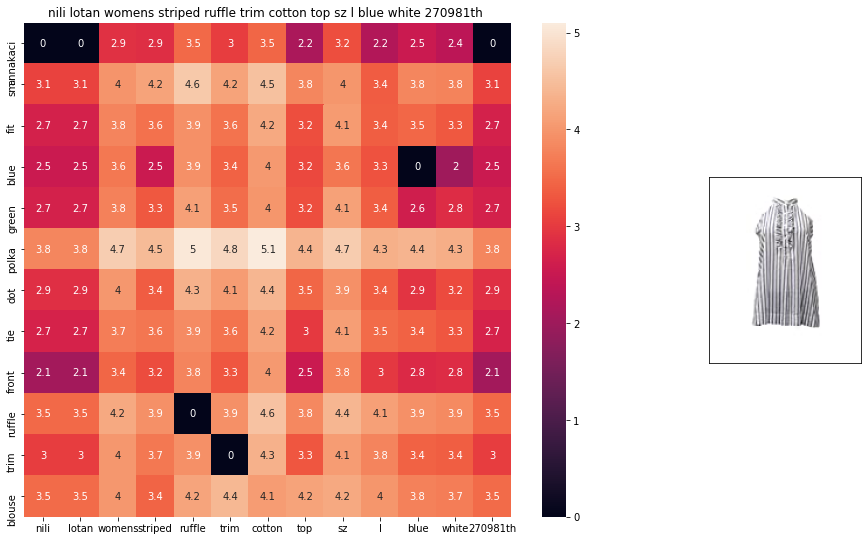

ASIN : B074PFR9CF
BRAND : Nili Lotan
euclidean distance from given input image : 0.8217533


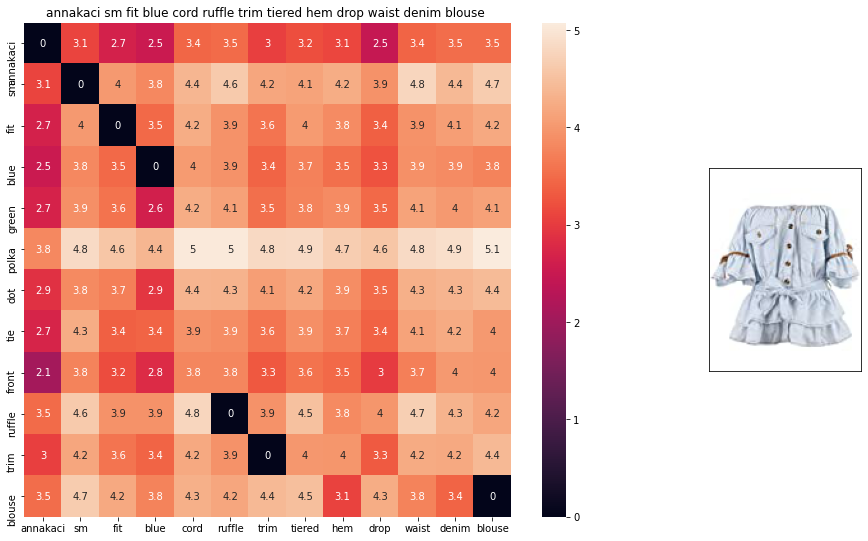

ASIN : B0759G15ZX
BRAND : Anna-Kaci
euclidean distance from given input image : 0.82678145


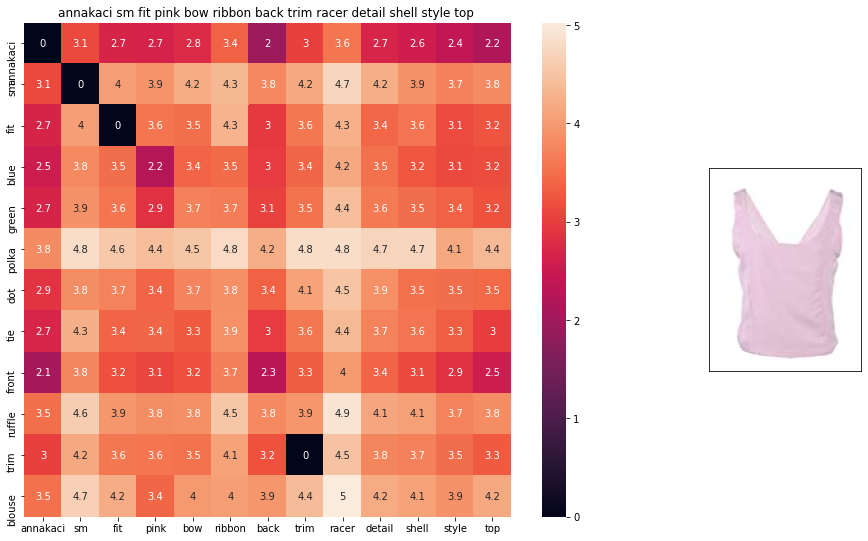

ASIN : B00KOBQEBO
BRAND : Anna-Kaci
euclidean distance from given input image : 0.8268438


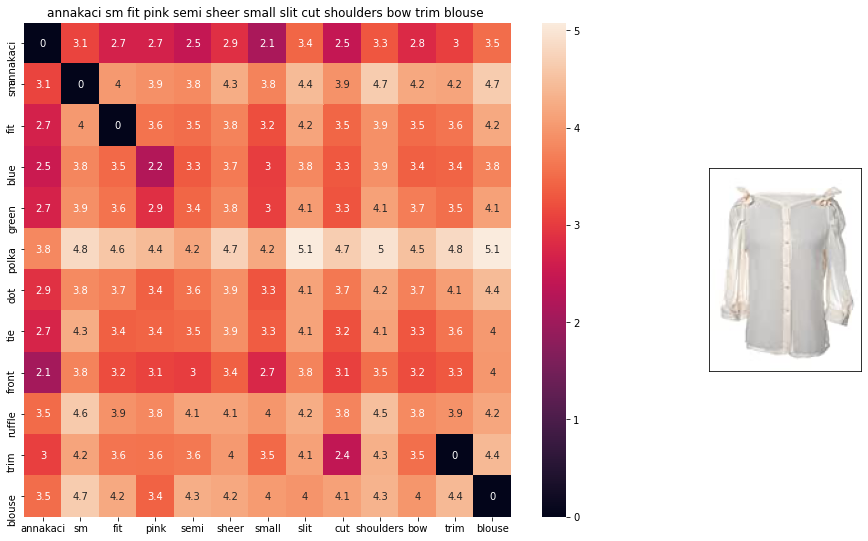

ASIN : B00HM9OD8W
BRAND : Anna-Kaci
euclidean distance from given input image : 0.82737076


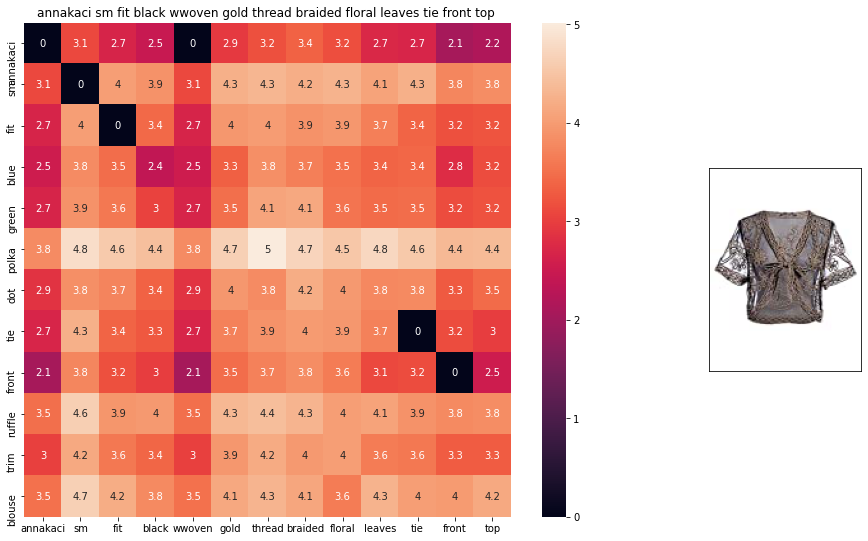

ASIN : B00E7Z8DWQ
BRAND : Anna-Kaci
euclidean distance from given input image : 0.8279004


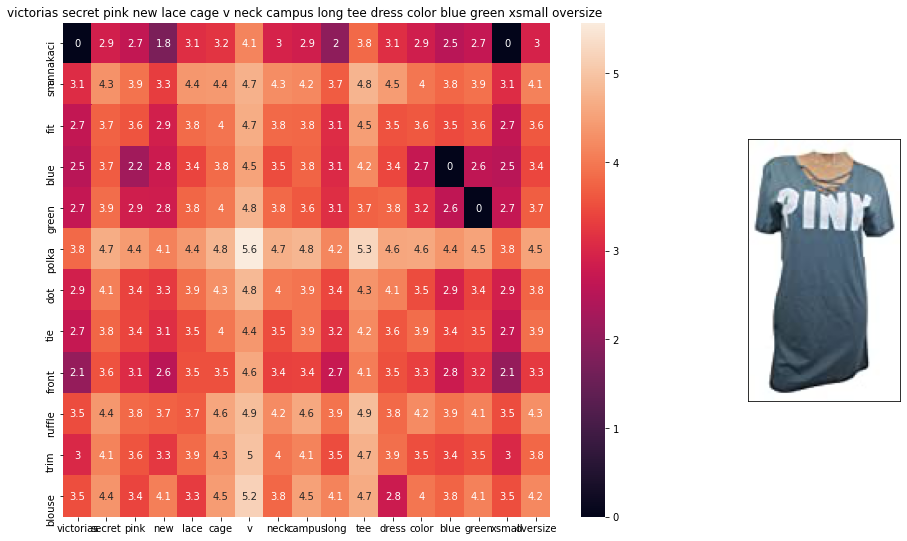

ASIN : B074JKJHNQ
BRAND : VS Pink
euclidean distance from given input image : 0.8330928


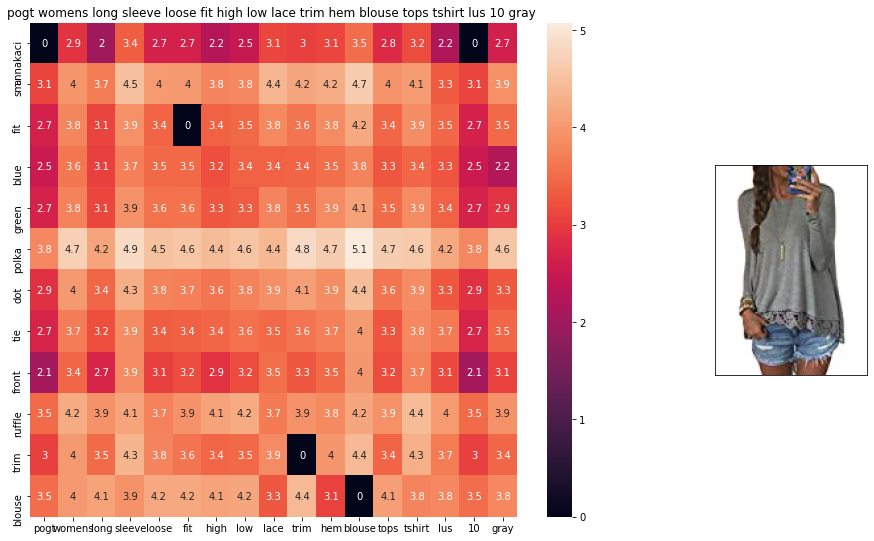

ASIN : B01M19NC0Y
BRAND : POGT
euclidean distance from given input image : 0.8357964


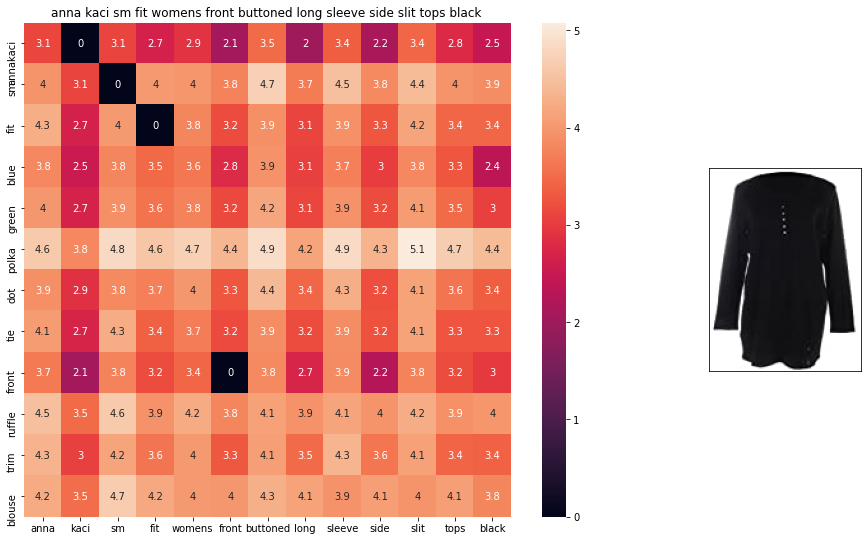

ASIN : B019820A4Q
BRAND : Anna-Kaci
euclidean distance from given input image : 0.84296256


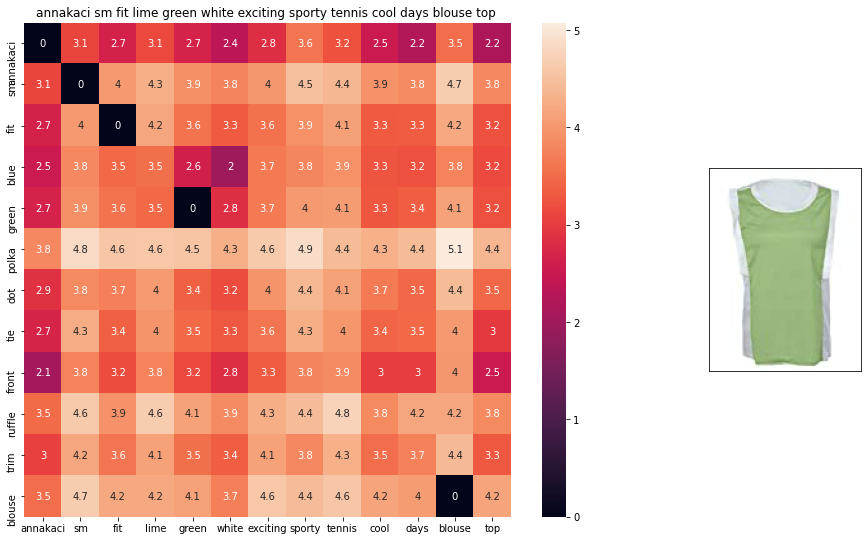

ASIN : B007Y9SZSY
BRAND : Anna-Kaci
euclidean distance from given input image : 0.84324485


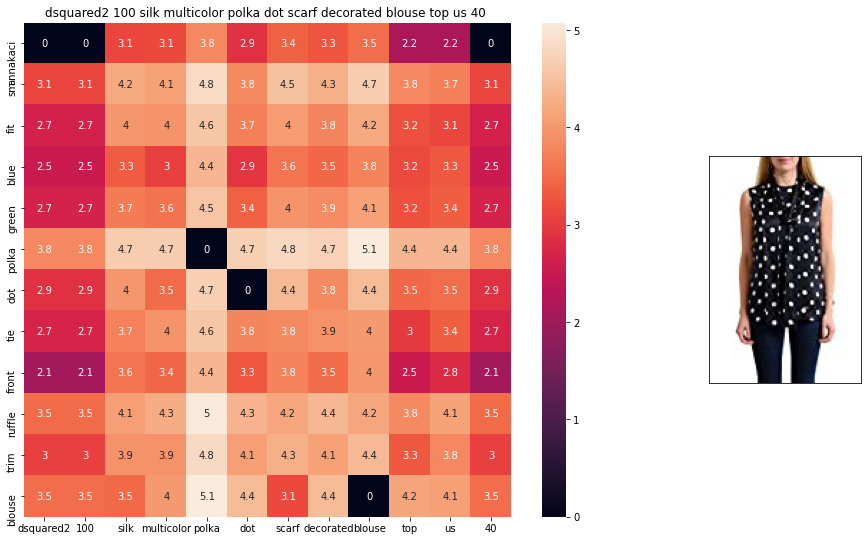

ASIN : B01D6FVFH2
BRAND : DSQUARED2
euclidean distance from given input image : 0.8452495


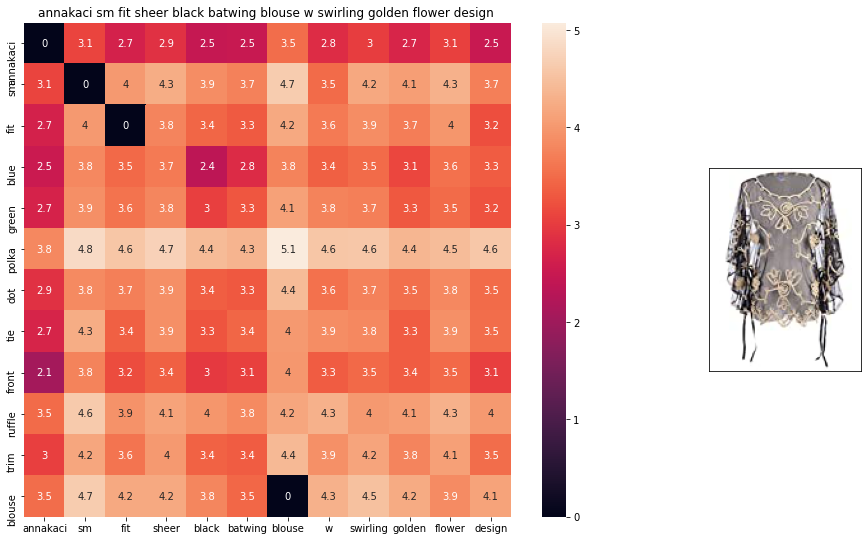

ASIN : B008LE9GA2
BRAND : Anna-Kaci
euclidean distance from given input image : 0.84813696


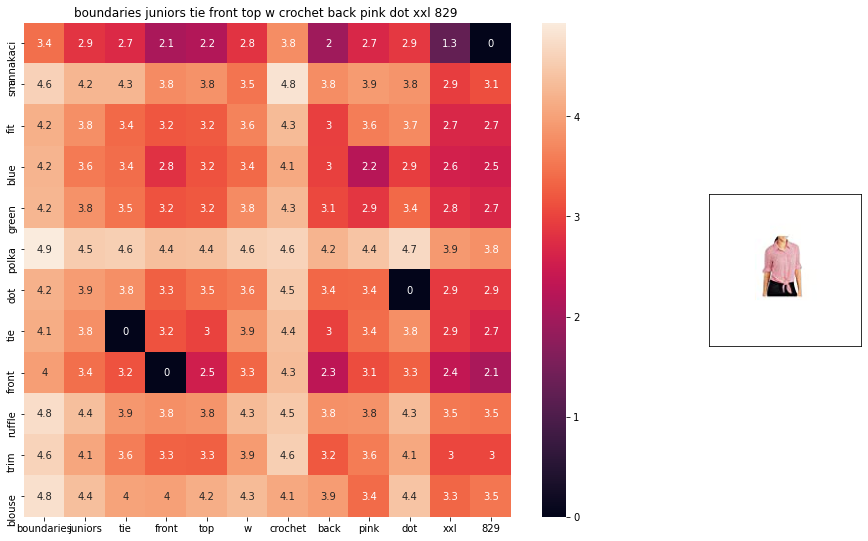

ASIN : B01JCZWOUW
BRAND : No Boundaries
euclidean distance from given input image : 0.8488442


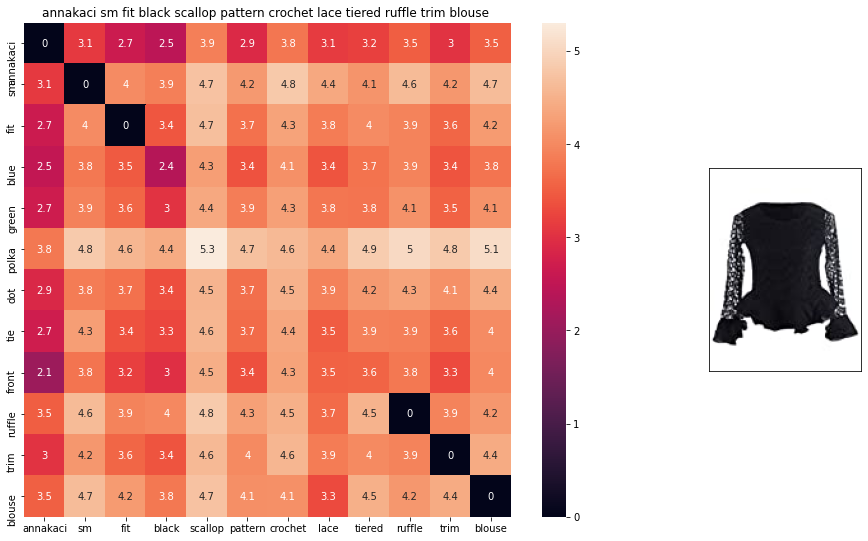

ASIN : B00O194W8W
BRAND : Anna-Kaci
euclidean distance from given input image : 0.8498151


In [14]:
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        
avg_w2v_model(931, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

### [9.4]  IDF weighted Word2Vec for product similarity

In [0]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

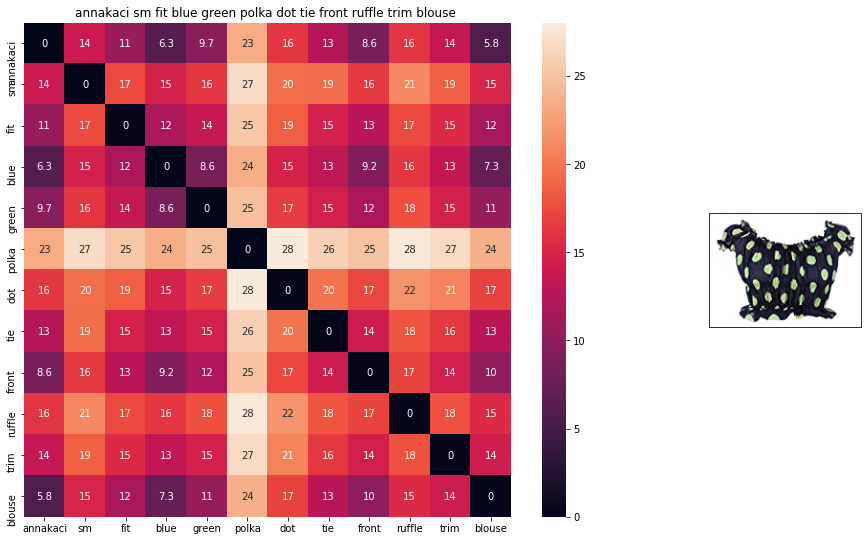

ASIN : B00KLHUIBS
Brand : Anna-Kaci
euclidean distance from input : 0.0


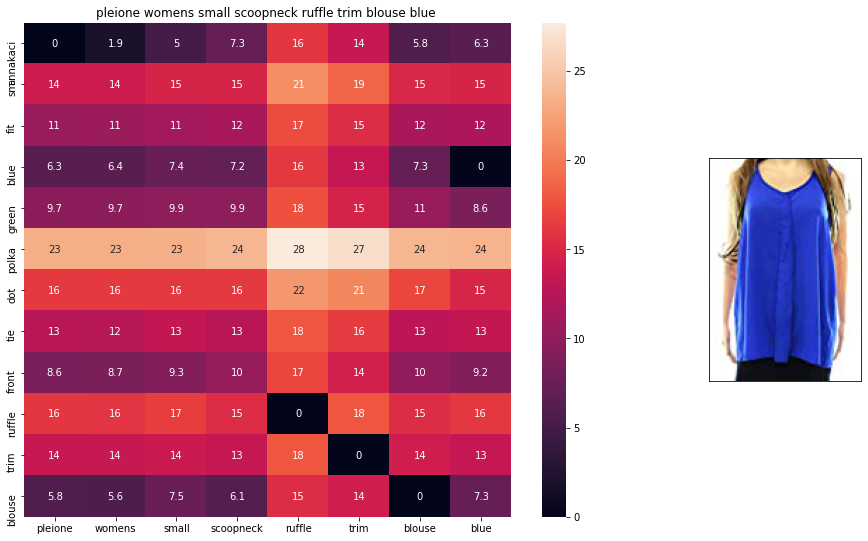

ASIN : B072VHTT1D
Brand : Pleione
euclidean distance from input : 3.3046243


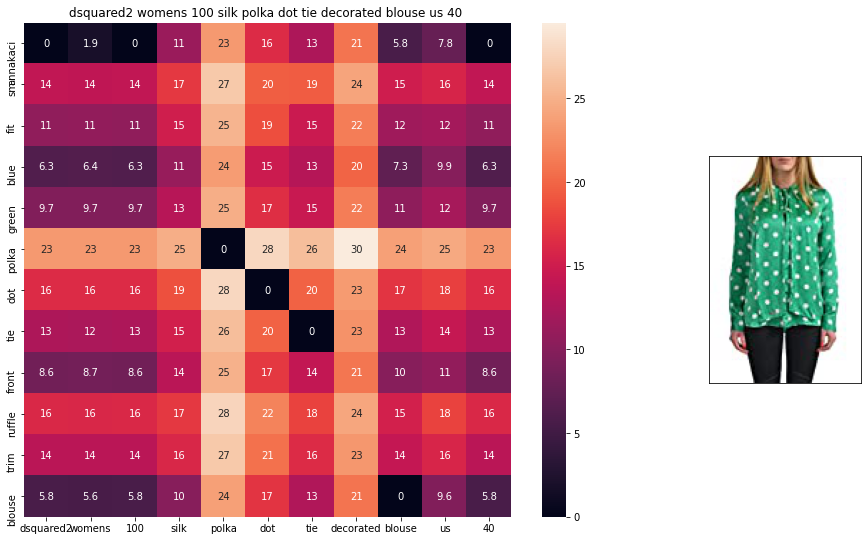

ASIN : B01AYBH28M
Brand : DSQUARED2
euclidean distance from input : 3.3703346


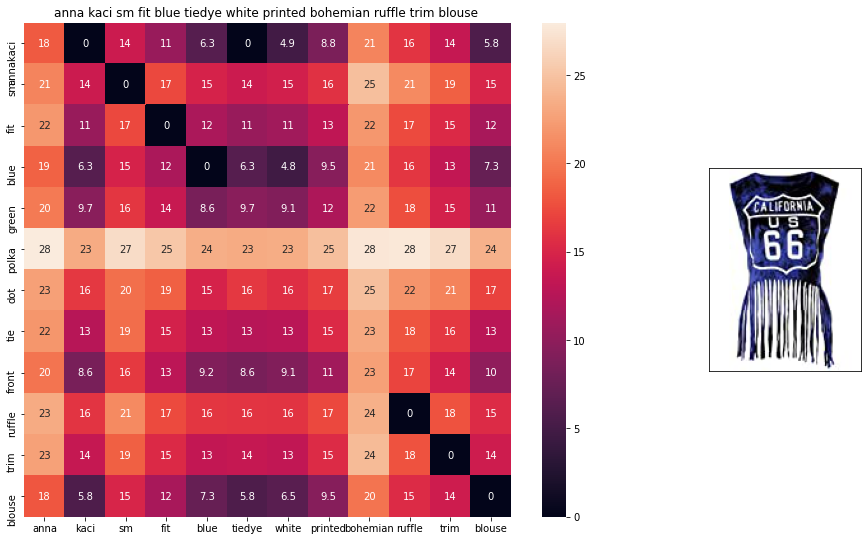

ASIN : B00YQ8S4K0
Brand : Anna-Kaci
euclidean distance from input : 3.4193525


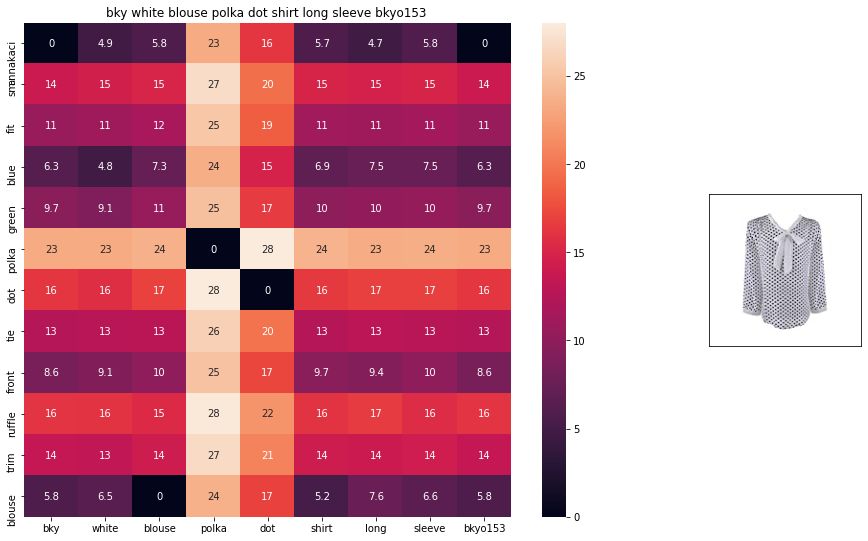

ASIN : B00ZD1LI16
Brand : bankhunyabangyai store
euclidean distance from input : 3.4255989


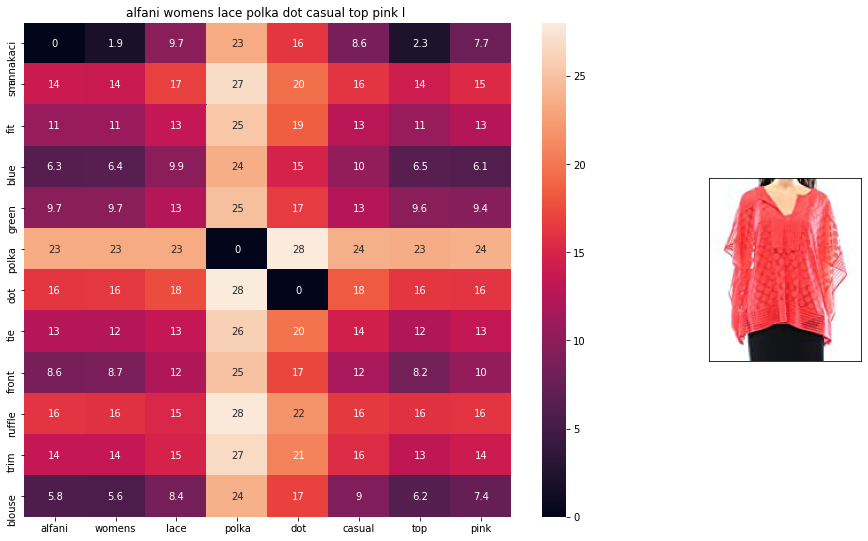

ASIN : B07125NJJ2
Brand : Alfani
euclidean distance from input : 3.4406197


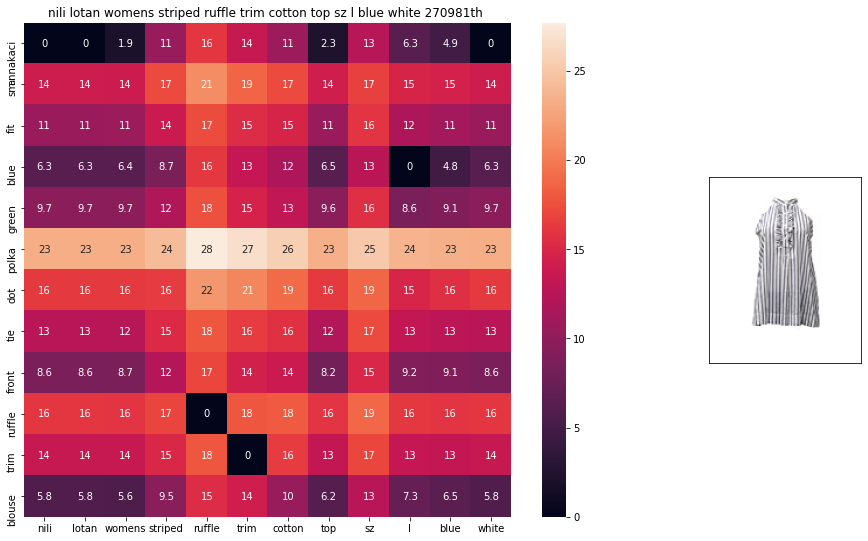

ASIN : B074PFR9CF
Brand : Nili Lotan
euclidean distance from input : 3.5470216


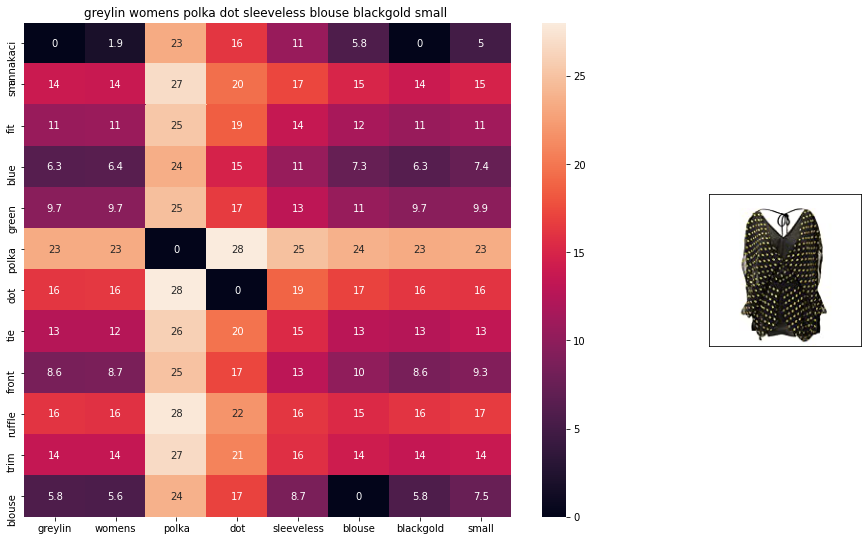

ASIN : B0725BZ69R
Brand : Greylin
euclidean distance from input : 3.570146


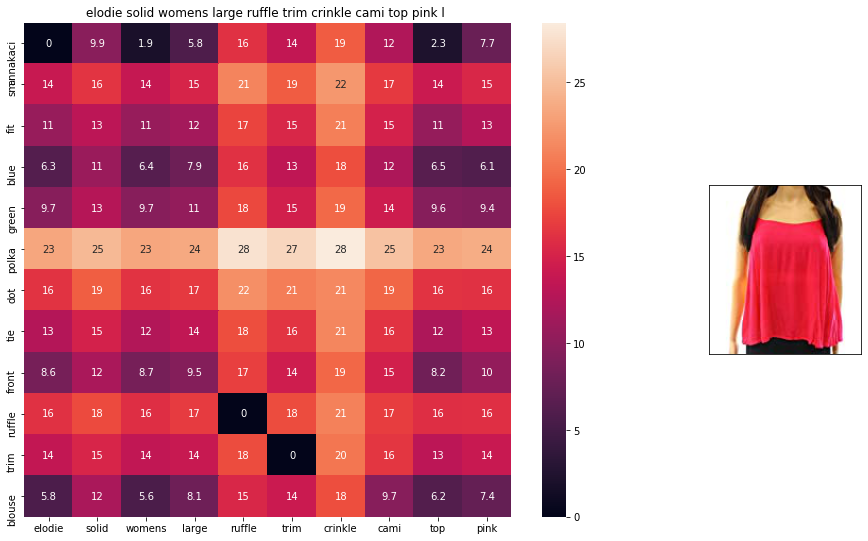

ASIN : B071XHZ2N2
Brand : Elodie
euclidean distance from input : 3.6468346


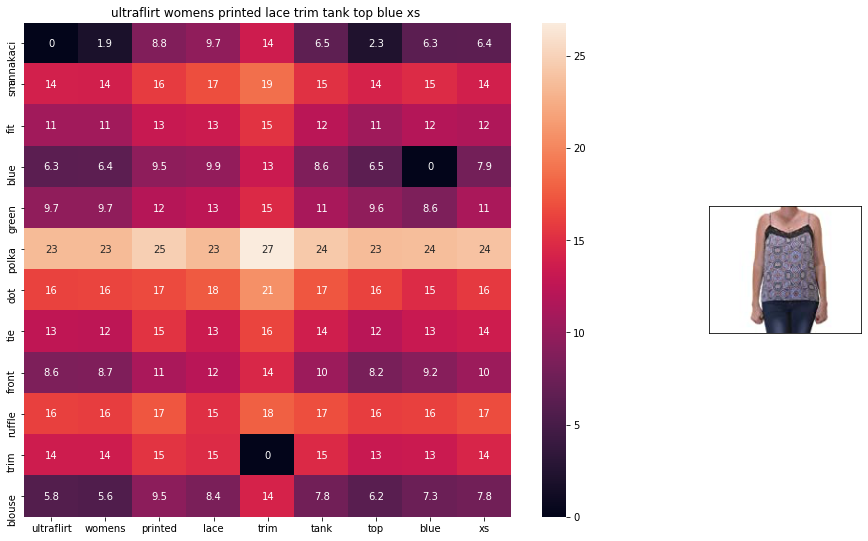

ASIN : B014JS4NIS
Brand : Ultra Flirt
euclidean distance from input : 3.6527064


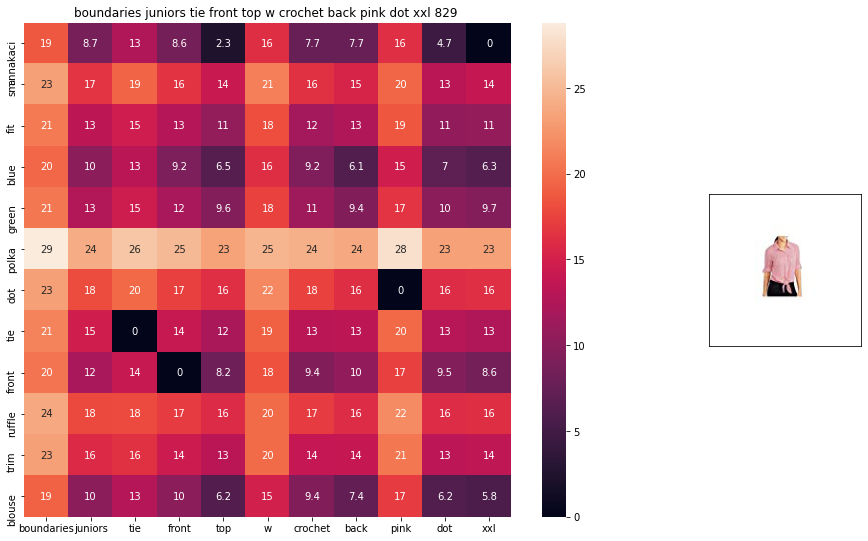

ASIN : B01JCZWOUW
Brand : No Boundaries
euclidean distance from input : 3.6577132


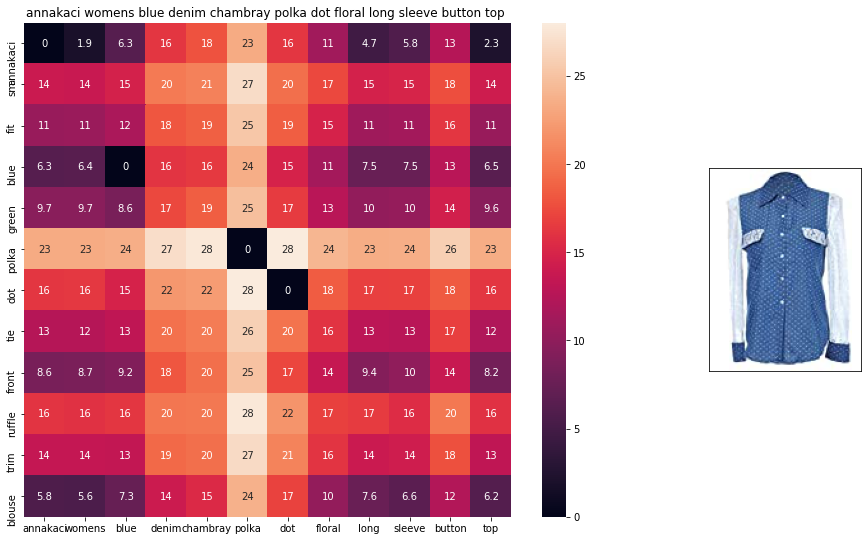

ASIN : B008SMIFN6
Brand : Anna-Kaci
euclidean distance from input : 3.6822648


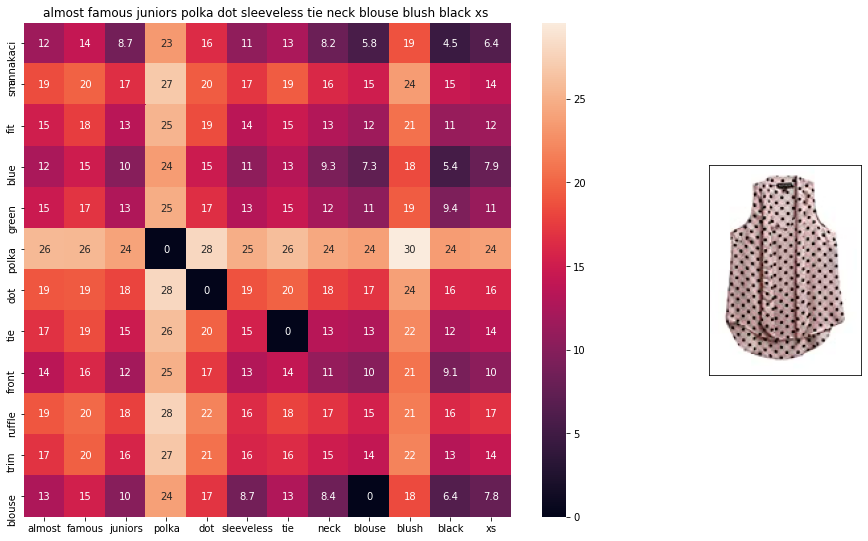

ASIN : B0745J9HNS
Brand : Almost Famous
euclidean distance from input : 3.7160883


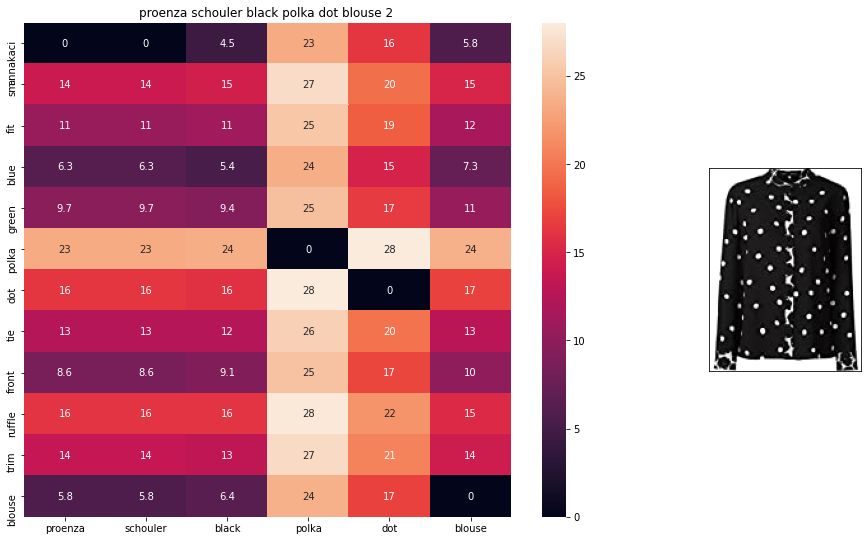

ASIN : B074TLHLMN
Brand : Proenza Schouler
euclidean distance from input : 3.721807


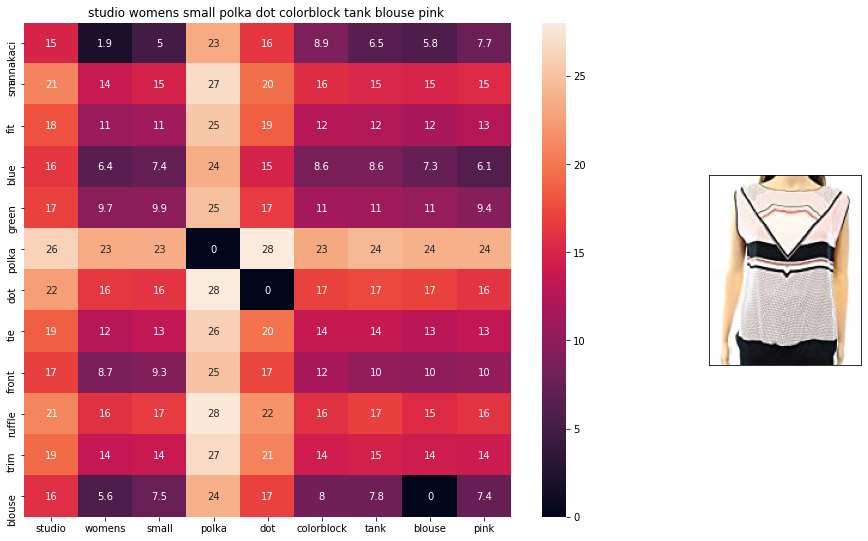

ASIN : B0721KC2HT
Brand : Studio M
euclidean distance from input : 3.7407618


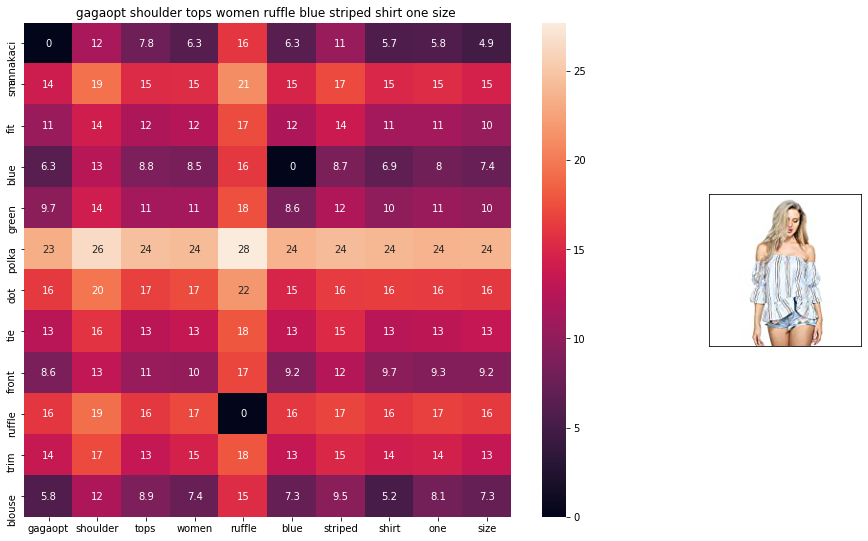

ASIN : B0731KJL5J
Brand : gagaopt
euclidean distance from input : 3.7530394


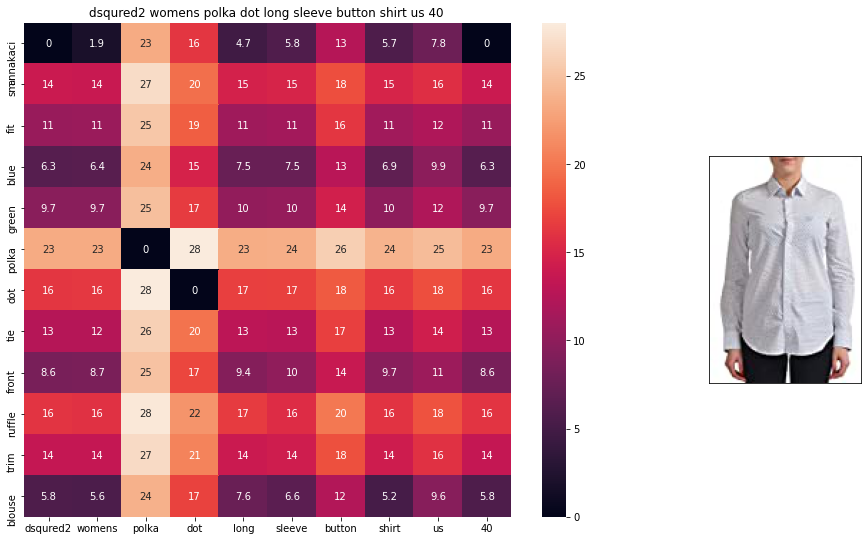

ASIN : B01APYN5AM
Brand : DSQUARED2
euclidean distance from input : 3.770843


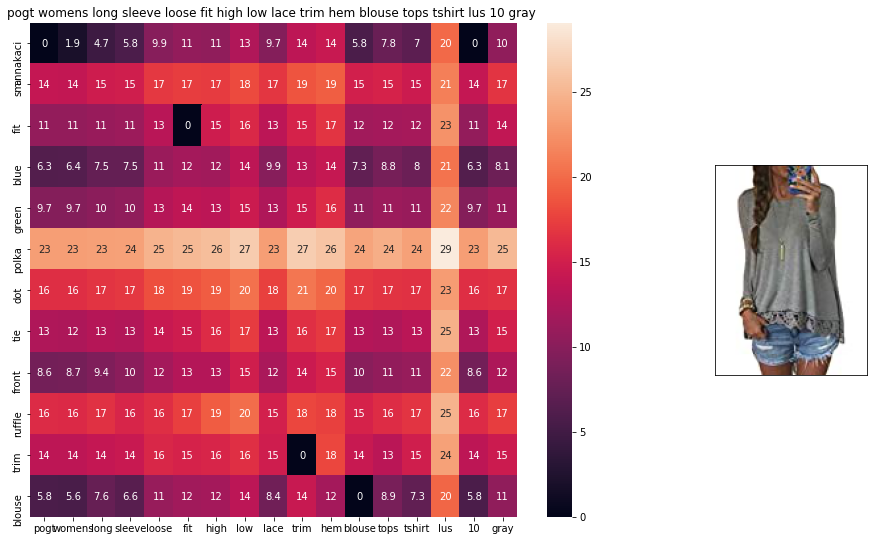

ASIN : B01M19NC0Y
Brand : POGT
euclidean distance from input : 3.7775102


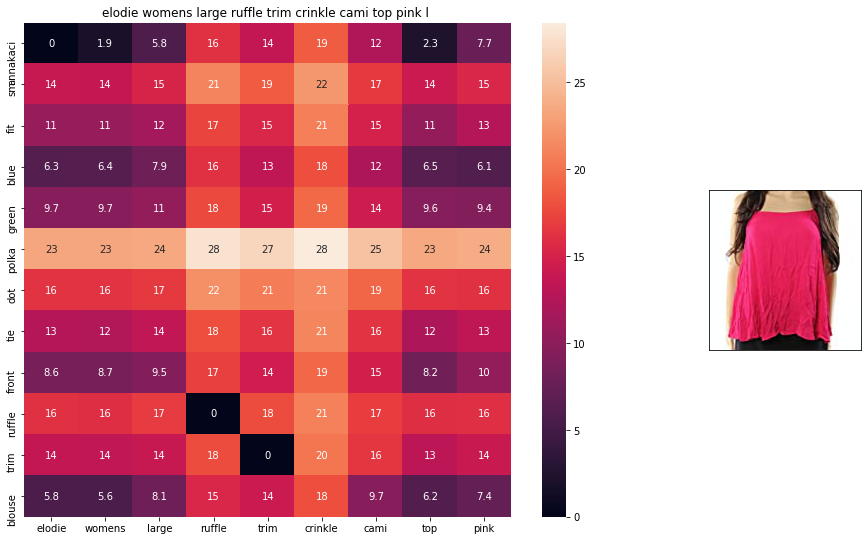

ASIN : B06XD3ZTCB
Brand : Elodie
euclidean distance from input : 3.7784634


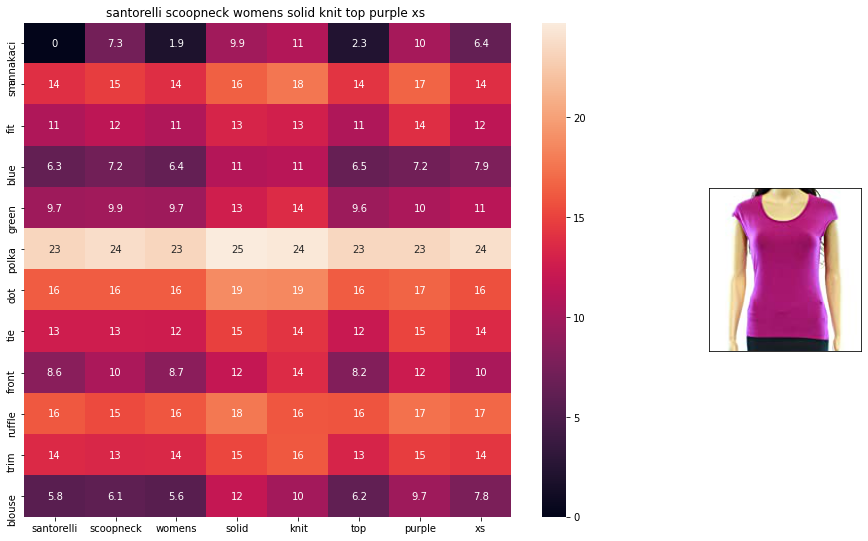

ASIN : B074QW18HZ
Brand : Santorelli
euclidean distance from input : 3.7946742


In [16]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

weighted_w2v_model(931, 20)
#931
#12566
# in the give heat map, each cell contains the euclidean distance between words i, j

### [9.6] Weighted similarity using brand and color.

In [0]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [0]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

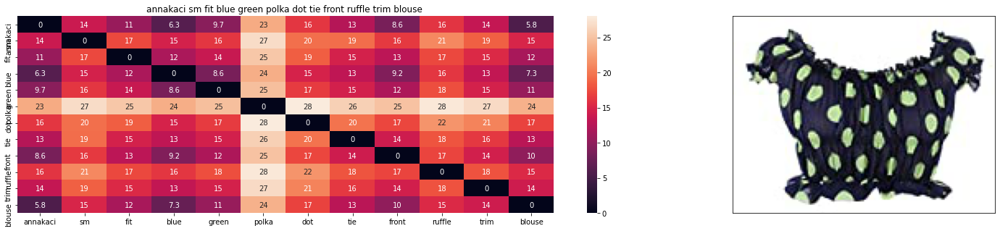

ASIN : B00KLHUIBS
Brand : Anna-Kaci
euclidean distance from input : 0.0


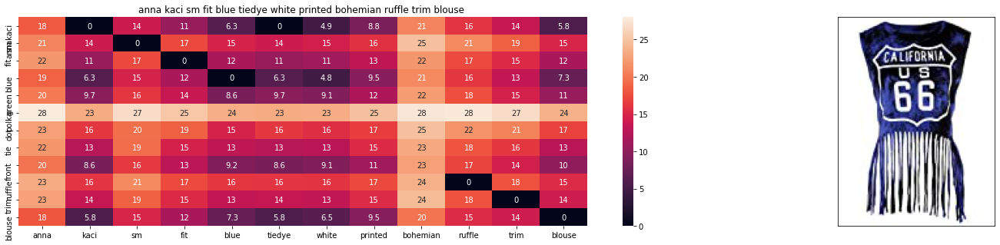

ASIN : B00YQ8S4K0
Brand : Anna-Kaci
euclidean distance from input : 2.2096763610839845


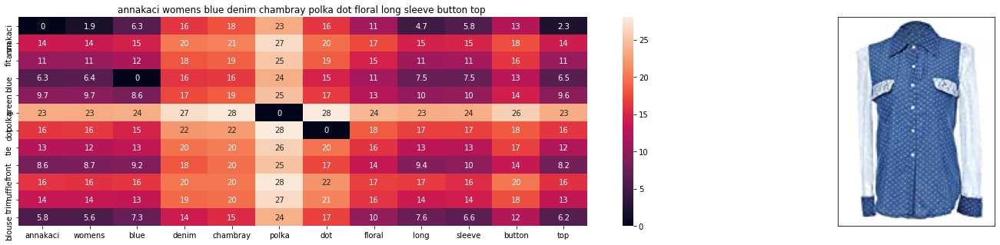

ASIN : B008SMIFN6
Brand : Anna-Kaci
euclidean distance from input : 2.3411323547363283


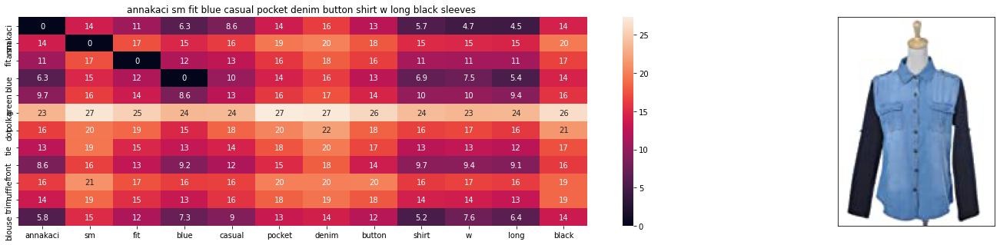

ASIN : B0097LQOOY
Brand : Anna-Kaci
euclidean distance from input : 2.5235042572021484


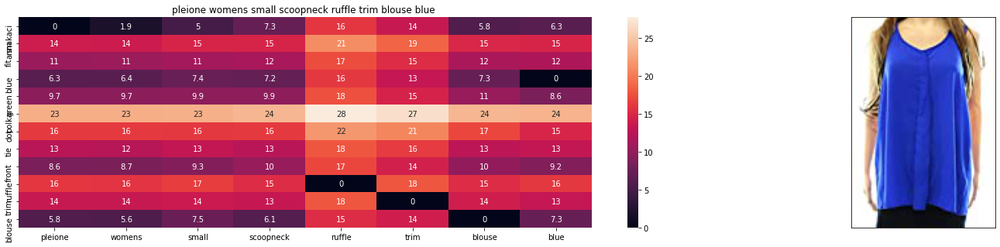

ASIN : B072VHTT1D
Brand : Pleione
euclidean distance from input : 2.652312088012695


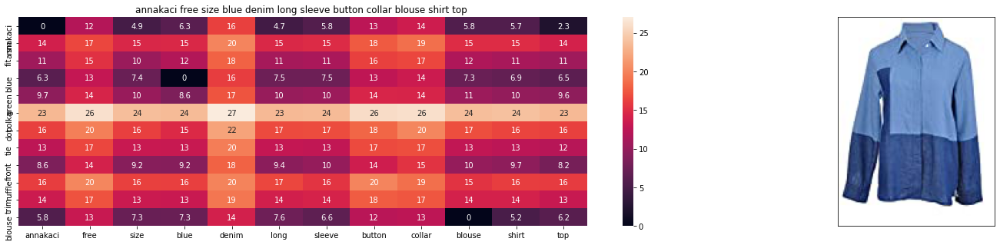

ASIN : B00726I25U
Brand : Anna-Kaci
euclidean distance from input : 2.6782474517822266


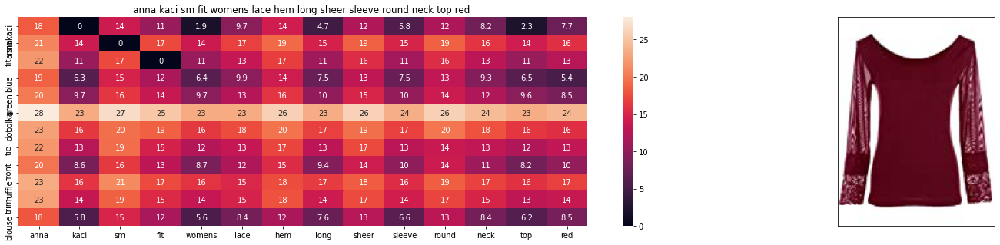

ASIN : B019XS6OLS
Brand : Anna-Kaci
euclidean distance from input : 2.767575124548599


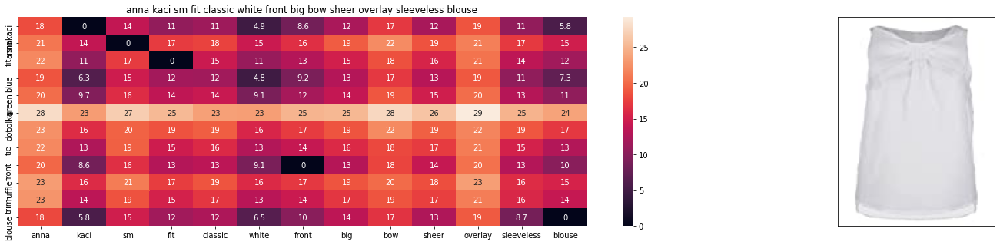

ASIN : B010EH3S02
Brand : Anna-Kaci
euclidean distance from input : 2.814418462561294


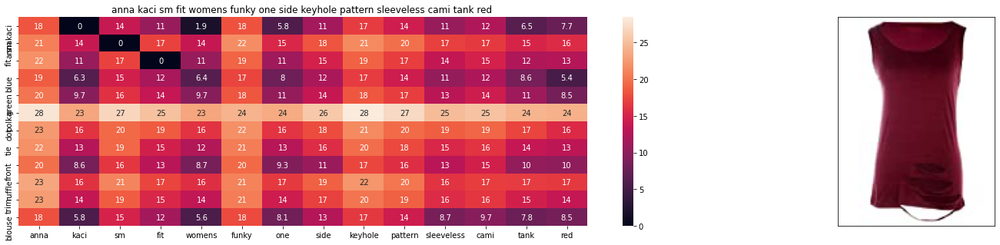

ASIN : B019NQLRF8
Brand : Anna-Kaci
euclidean distance from input : 2.8479427850710595


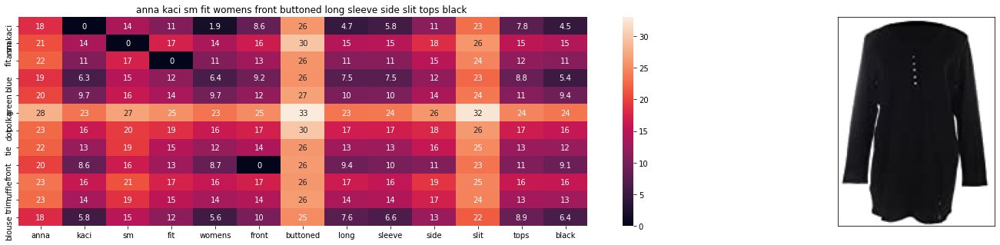

ASIN : B019820A4Q
Brand : Anna-Kaci
euclidean distance from input : 2.873210386084243


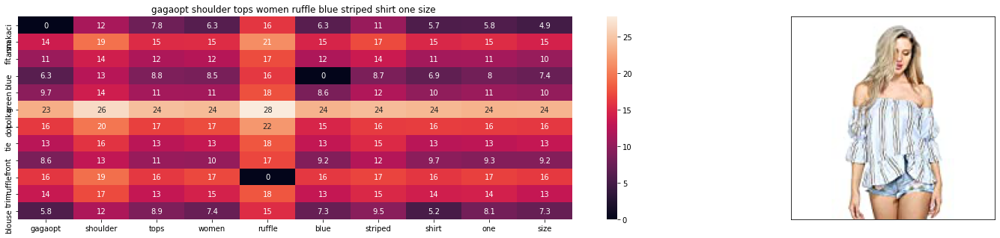

ASIN : B0731KJL5J
Brand : gagaopt
euclidean distance from input : 2.876519775390625


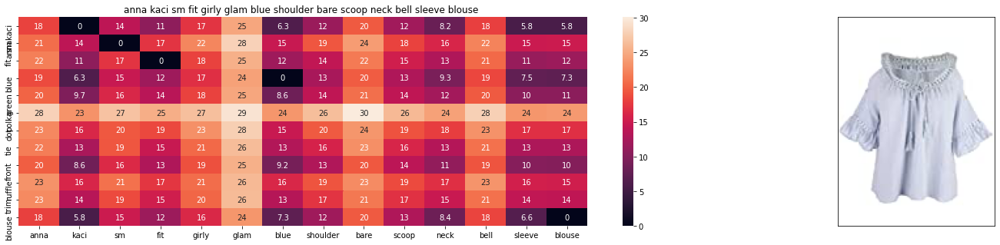

ASIN : B0128Z19IQ
Brand : Anna-Kaci
euclidean distance from input : 2.877251625061035


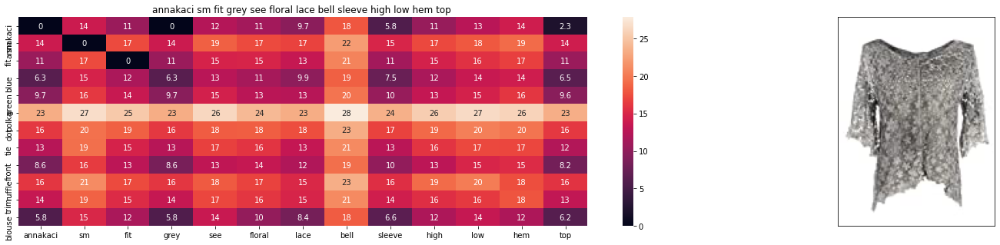

ASIN : B00NAEMMW2
Brand : Anna-Kaci
euclidean distance from input : 2.8801903284060204


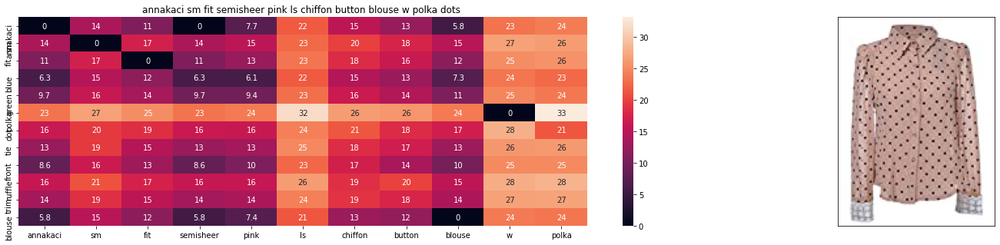

ASIN : B008Z5ST3C
Brand : Anna-Kaci
euclidean distance from input : 2.8918119943606104


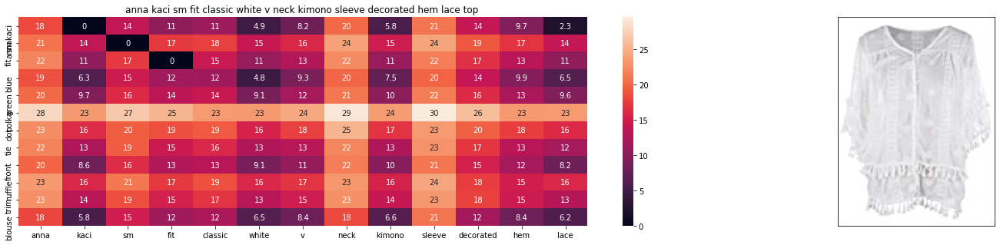

ASIN : B011WFBMBC
Brand : Anna-Kaci
euclidean distance from input : 2.9190594232546534


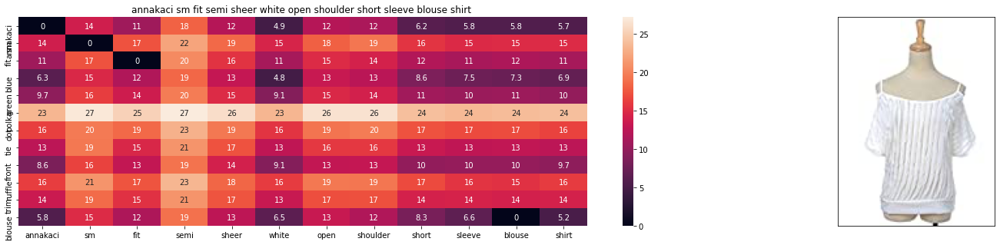

ASIN : B007HCB8XM
Brand : Anna-Kaci
euclidean distance from input : 2.923176435278579


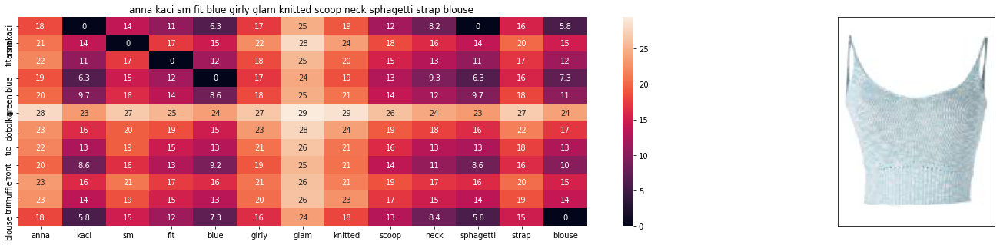

ASIN : B010EH1PCK
Brand : Anna-Kaci
euclidean distance from input : 2.92809944152832


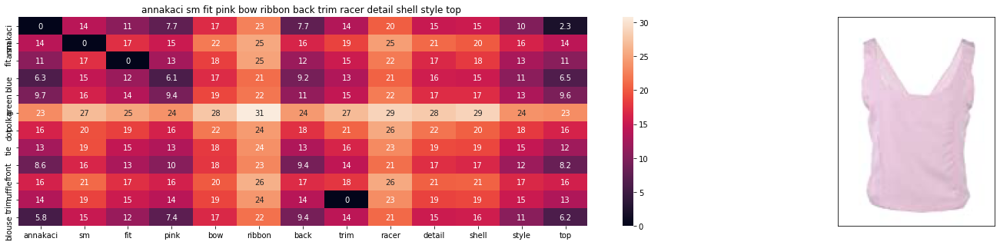

ASIN : B00KOBQEBO
Brand : Anna-Kaci
euclidean distance from input : 2.9400480783449856


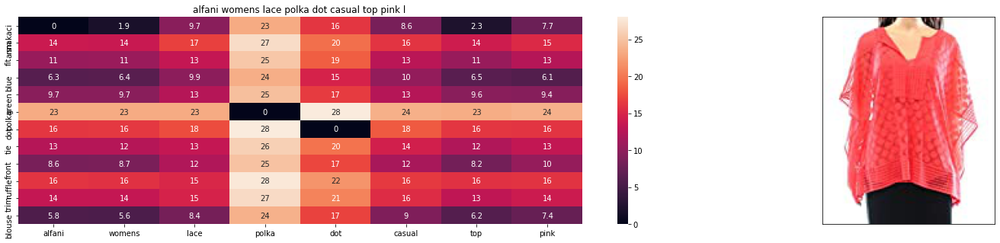

ASIN : B07125NJJ2
Brand : Alfani
euclidean distance from input : 2.945054701103503


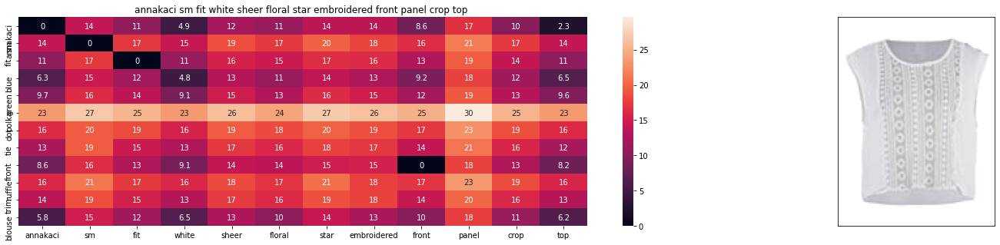

ASIN : B00NAB1R8A
Brand : Anna-Kaci
euclidean distance from input : 2.9476131952273095


In [19]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 20 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 20 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    #data frame indices of the 20 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(931, 5, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

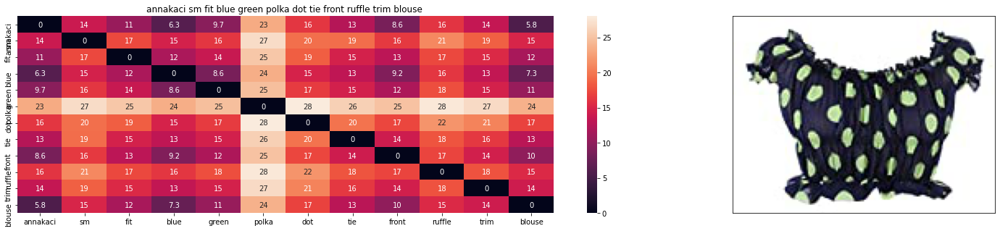

ASIN : B00KLHUIBS
Brand : Anna-Kaci
euclidean distance from input : 0.0


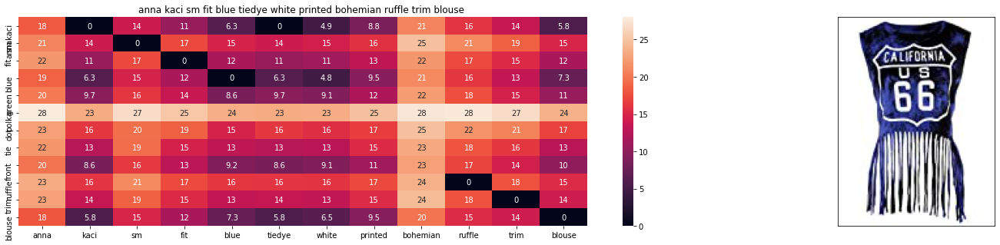

ASIN : B00YQ8S4K0
Brand : Anna-Kaci
euclidean distance from input : 1.2199411565607243


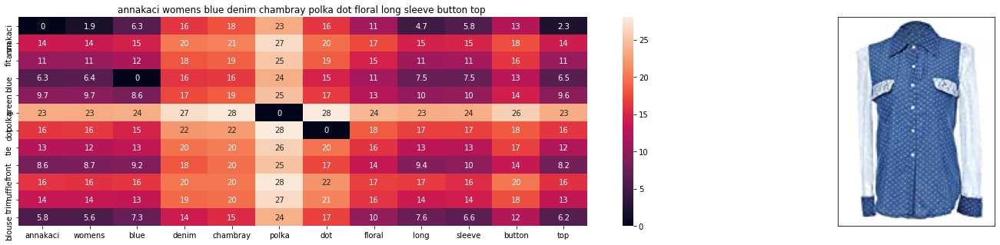

ASIN : B008SMIFN6
Brand : Anna-Kaci
euclidean distance from input : 1.243842246315696


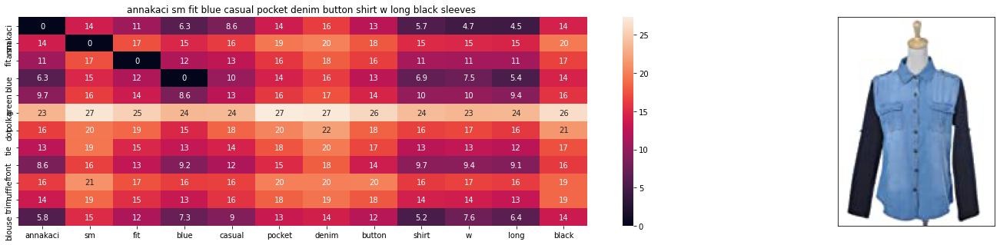

ASIN : B0097LQOOY
Brand : Anna-Kaci
euclidean distance from input : 1.2770007740367542


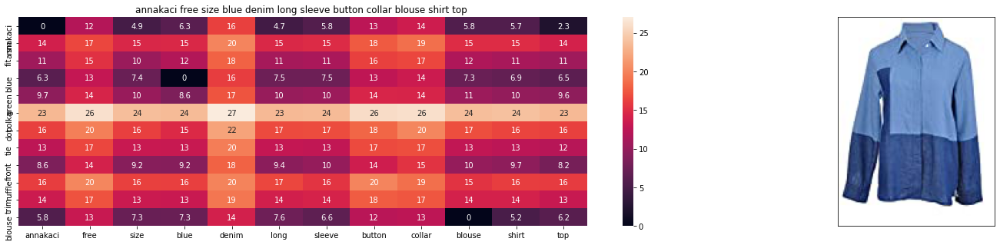

ASIN : B00726I25U
Brand : Anna-Kaci
euclidean distance from input : 1.3051359003240413


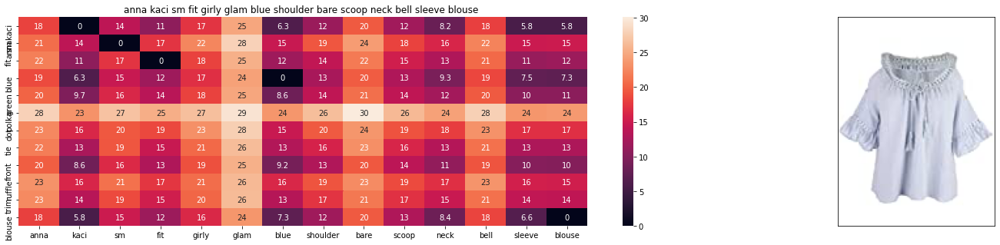

ASIN : B0128Z19IQ
Brand : Anna-Kaci
euclidean distance from input : 1.3413184772838245


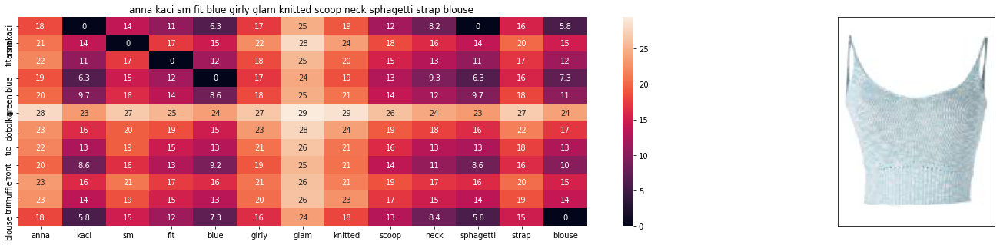

ASIN : B010EH1PCK
Brand : Anna-Kaci
euclidean distance from input : 1.350563534823331


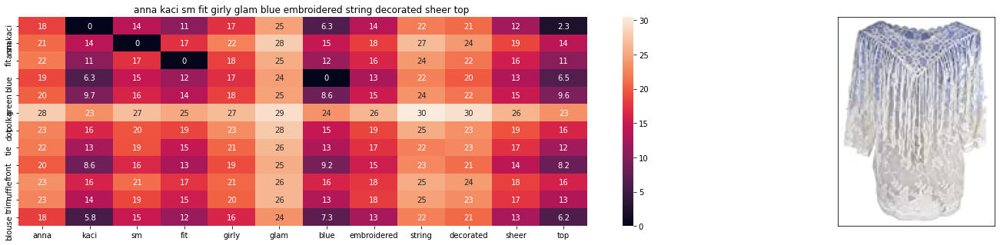

ASIN : B0128Z1BNO
Brand : Anna-Kaci
euclidean distance from input : 1.364266690340909


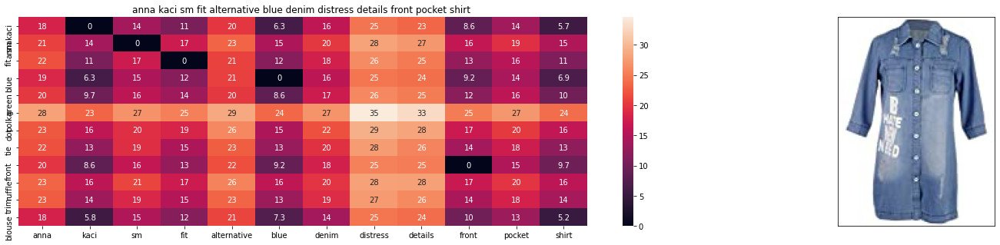

ASIN : B010EH2WCW
Brand : Anna-Kaci
euclidean distance from input : 1.3654567371715198


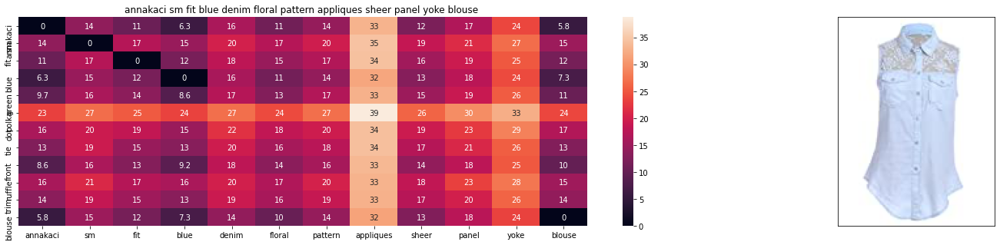

ASIN : B00E7Z8G8M
Brand : Anna-Kaci
euclidean distance from input : 1.4247143138538707


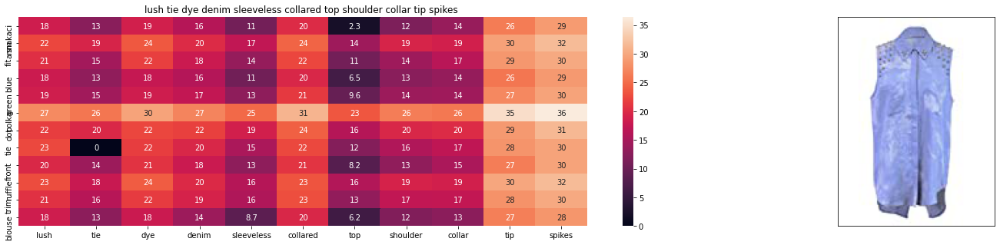

ASIN : B00FH9CBE2
Brand : Anna-Kaci
euclidean distance from input : 1.5177067843350498


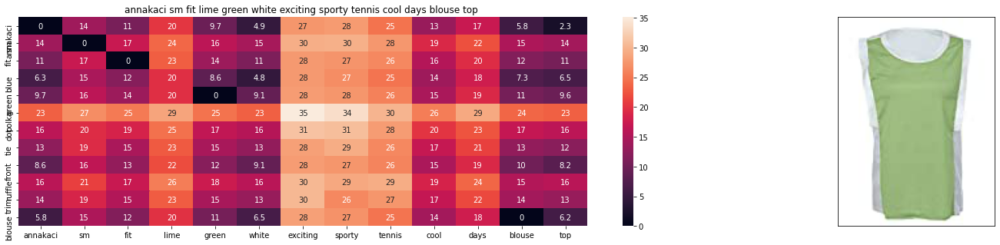

ASIN : B007Y9SZSY
Brand : Anna-Kaci
euclidean distance from input : 1.7635778603804593


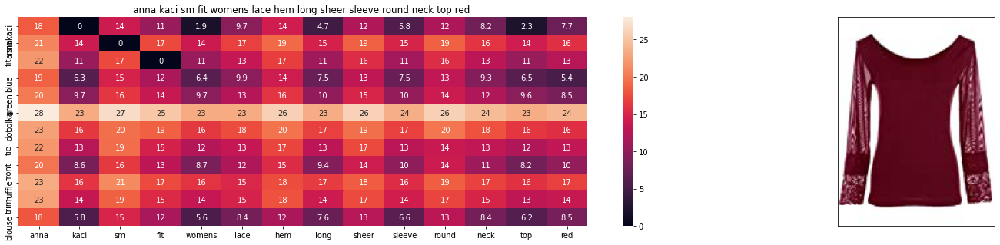

ASIN : B019XS6OLS
Brand : Anna-Kaci
euclidean distance from input : 1.9203279561106448


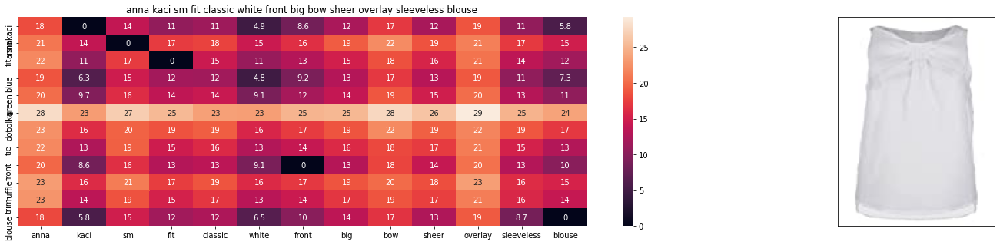

ASIN : B010EH3S02
Brand : Anna-Kaci
euclidean distance from input : 1.9288449266584076


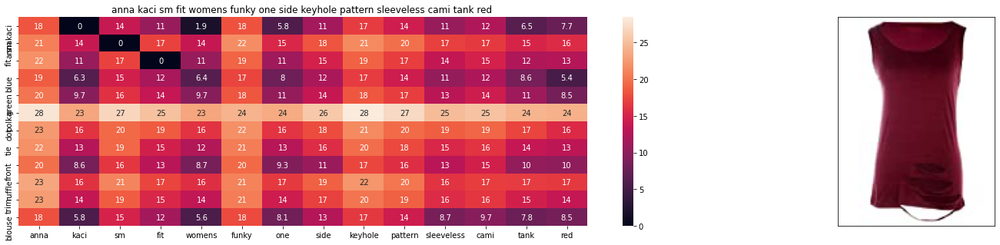

ASIN : B019NQLRF8
Brand : Anna-Kaci
euclidean distance from input : 1.9349402580238195


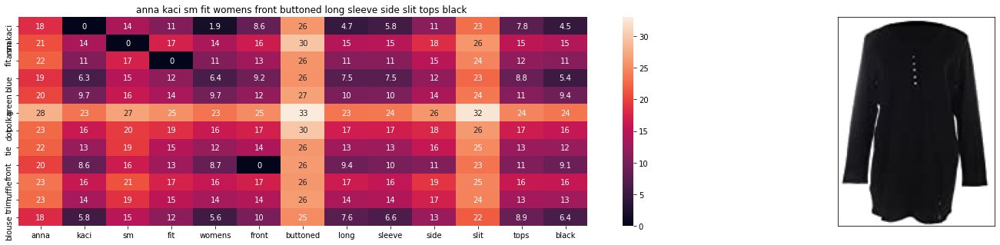

ASIN : B019820A4Q
Brand : Anna-Kaci
euclidean distance from input : 1.9395343672989438


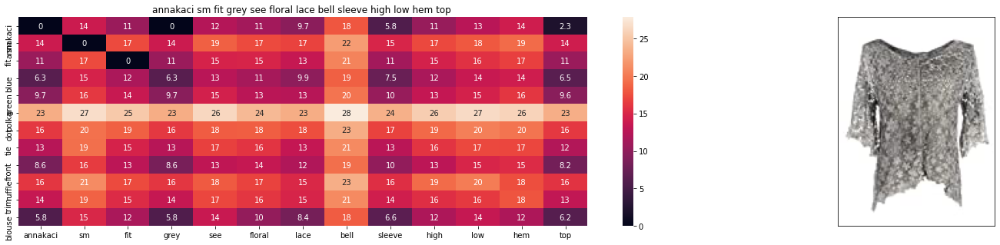

ASIN : B00NAEMMW2
Brand : Anna-Kaci
euclidean distance from input : 1.9408034477210852


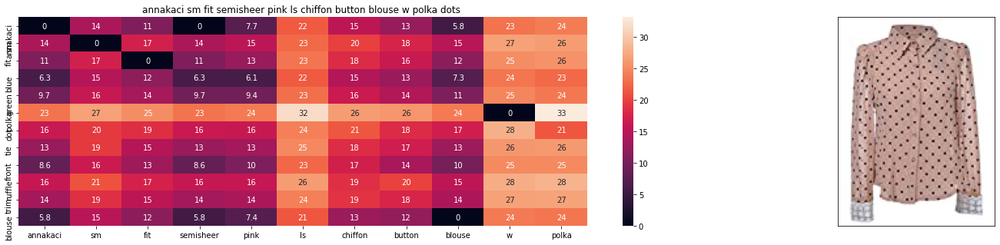

ASIN : B008Z5ST3C
Brand : Anna-Kaci
euclidean distance from input : 1.9429164778946468


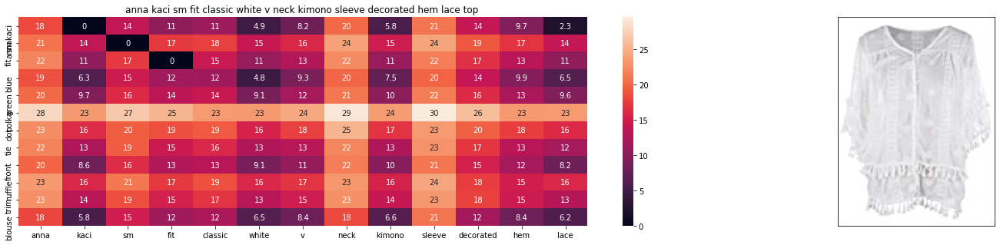

ASIN : B011WFBMBC
Brand : Anna-Kaci
euclidean distance from input : 1.947870555875382


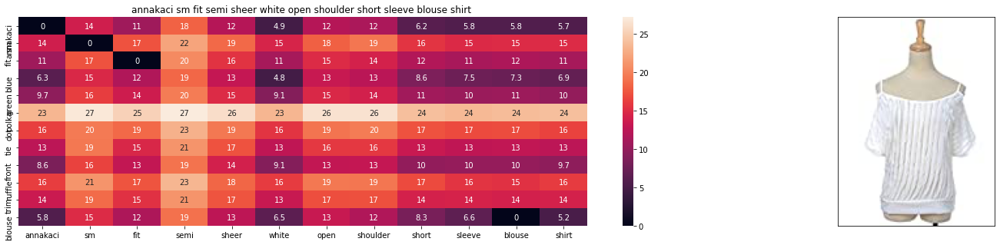

ASIN : B007HCB8XM
Brand : Anna-Kaci
euclidean distance from input : 1.9486191035160958


In [0]:
# brand and color weight =50
# title vector weight = 5

idf_w2v_brand(931, 5, 50, 20)

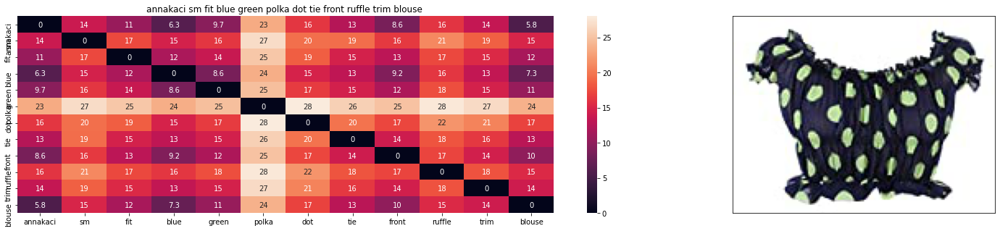

ASIN : B00KLHUIBS
Brand : Anna-Kaci
euclidean distance from input : 0.0


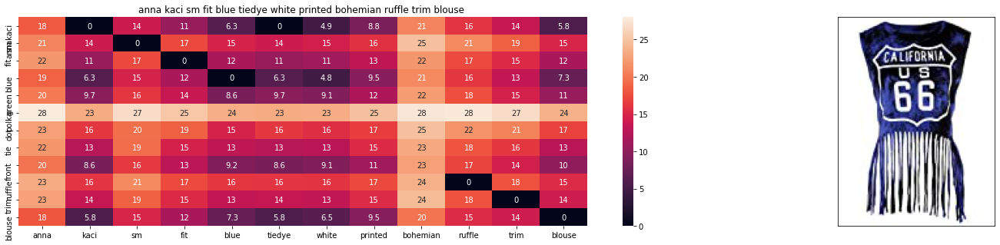

ASIN : B00YQ8S4K0
Brand : Anna-Kaci
euclidean distance from input : 2.0887085676193236


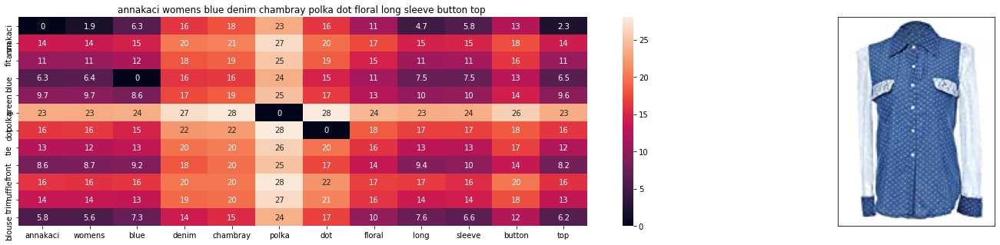

ASIN : B008SMIFN6
Brand : Anna-Kaci
euclidean distance from input : 2.2070191383361815


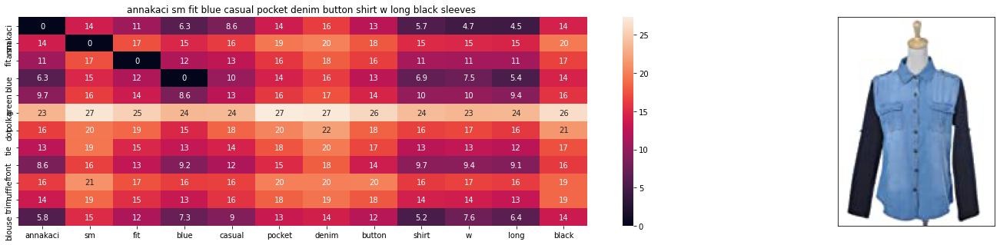

ASIN : B0097LQOOY
Brand : Anna-Kaci
euclidean distance from input : 2.3711537599563597


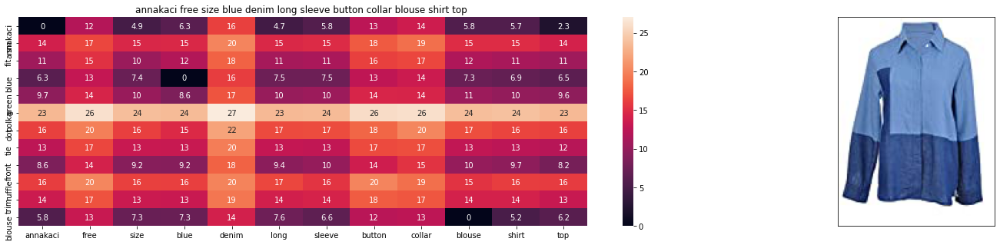

ASIN : B00726I25U
Brand : Anna-Kaci
euclidean distance from input : 2.51042263507843


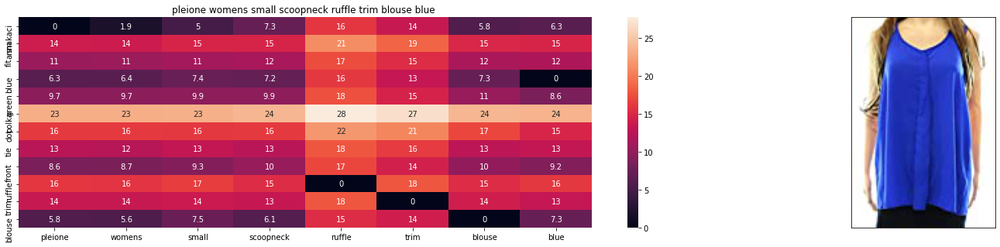

ASIN : B072VHTT1D
Brand : Pleione
euclidean distance from input : 2.5870809316635133


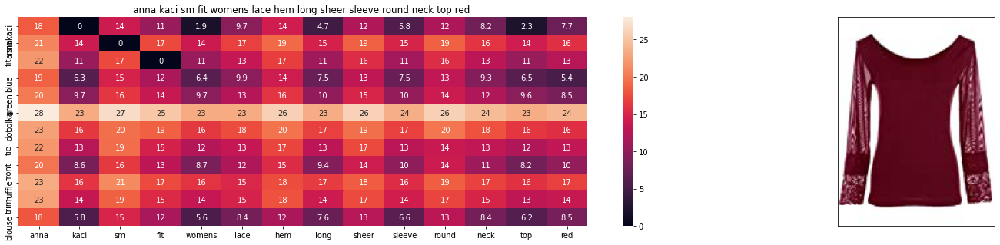

ASIN : B019XS6OLS
Brand : Anna-Kaci
euclidean distance from input : 2.66402261178831


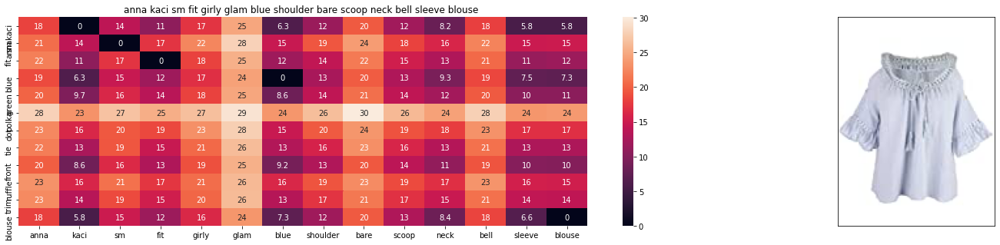

ASIN : B0128Z19IQ
Brand : Anna-Kaci
euclidean distance from input : 2.6895263671875


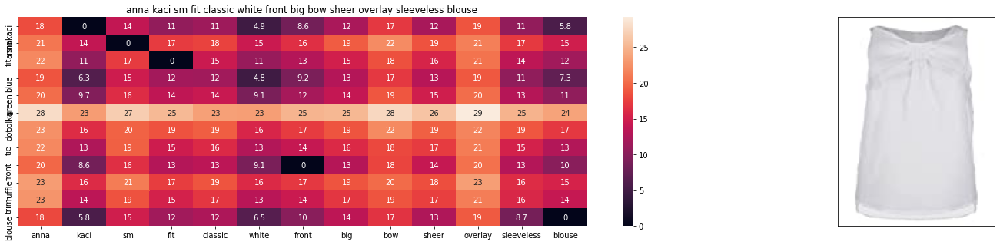

ASIN : B010EH3S02
Brand : Anna-Kaci
euclidean distance from input : 2.7061815730843914


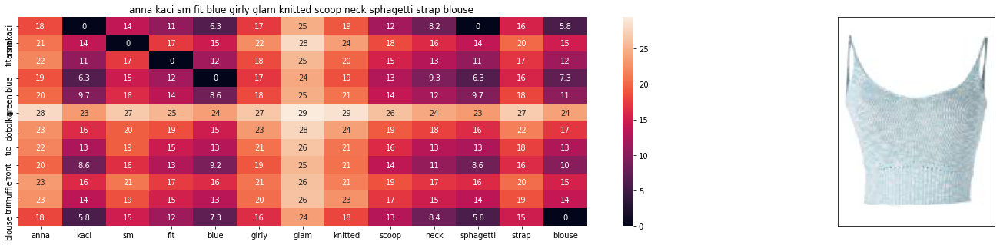

ASIN : B010EH1PCK
Brand : Anna-Kaci
euclidean distance from input : 2.73528938293457


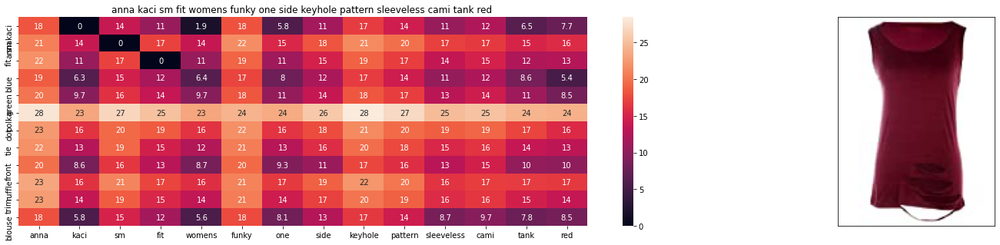

ASIN : B019NQLRF8
Brand : Anna-Kaci
euclidean distance from input : 2.7363535634789837


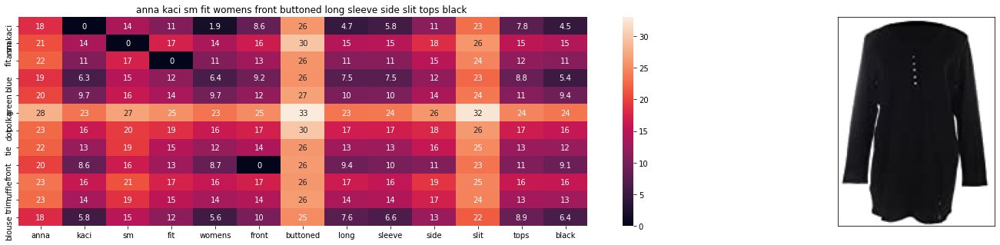

ASIN : B019820A4Q
Brand : Anna-Kaci
euclidean distance from input : 2.759094404390849


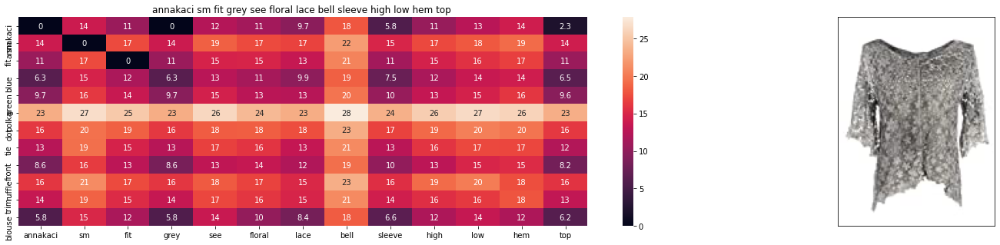

ASIN : B00NAEMMW2
Brand : Anna-Kaci
euclidean distance from input : 2.7653763763223065


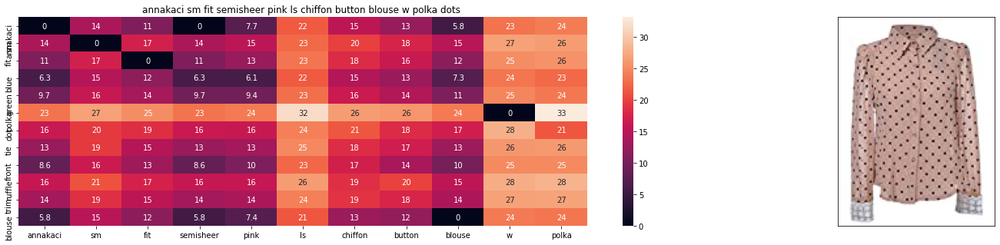

ASIN : B008Z5ST3C
Brand : Anna-Kaci
euclidean distance from input : 2.7758359185967816


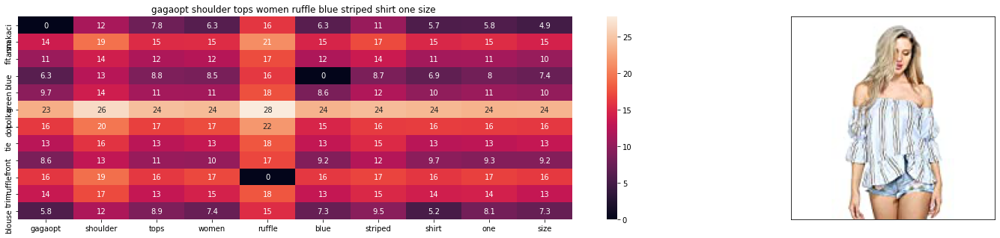

ASIN : B0731KJL5J
Brand : gagaopt
euclidean distance from input : 2.788867688179016


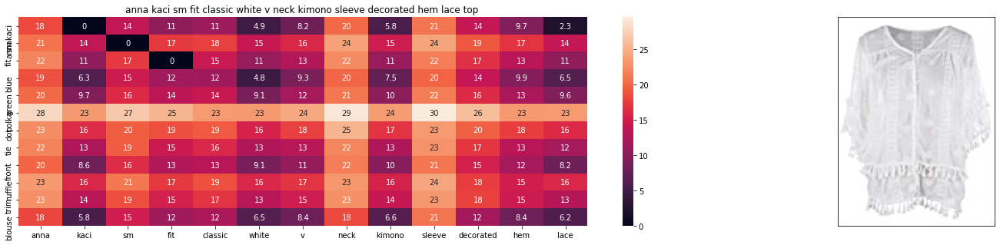

ASIN : B011WFBMBC
Brand : Anna-Kaci
euclidean distance from input : 2.8003585807595623


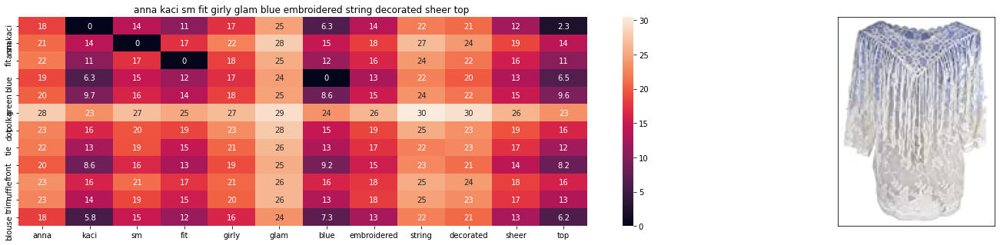

ASIN : B0128Z1BNO
Brand : Anna-Kaci
euclidean distance from input : 2.803120183944702


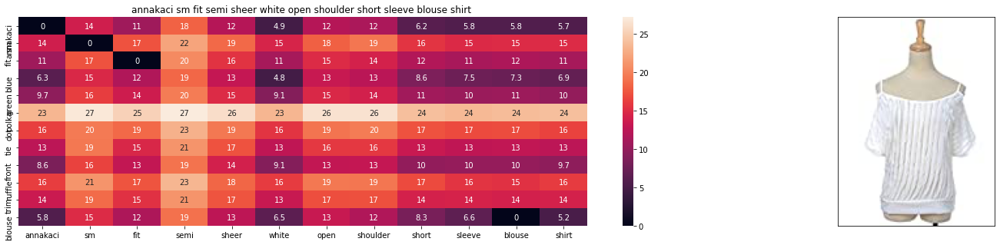

ASIN : B007HCB8XM
Brand : Anna-Kaci
euclidean distance from input : 2.8040638438973797


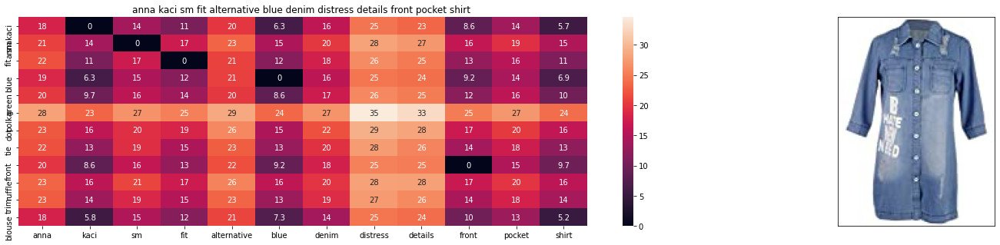

ASIN : B010EH2WCW
Brand : Anna-Kaci
euclidean distance from input : 2.8090107917785643


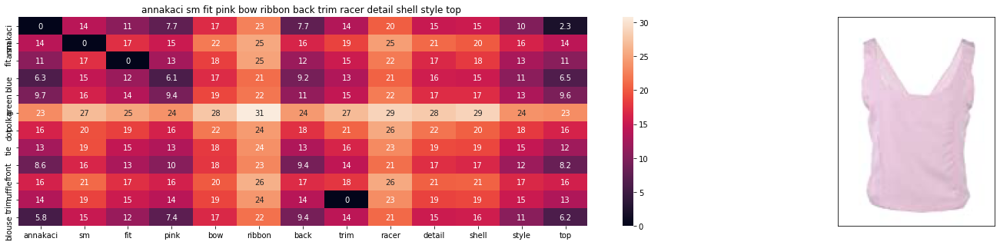

ASIN : B00KOBQEBO
Brand : Anna-Kaci
euclidean distance from input : 2.8192483655724896


In [0]:
idf_w2v_brand(931, 0.45, 0.55, 20)

# ---------------------------------------------------------------------------------------------------------

In [0]:
def idf_w2v_brand_image(doc_id, w1, w2, w3, w4, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    brand_feat_dist = pairwise_distances(brand_features, brand_features[doc_id])
    color_feat_dist = pairwise_distances(color_features, color_features[doc_id])
    img_feat_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * brand_feat_dist + w3*color_feat_dist + w4*img_feat_dist)/float(w1 + w2 + w3 + w4)

    # np.argsort will return indices of 20 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 20 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    #data frame indices of the 20 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(len(indices)):
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])
        print('='*125)

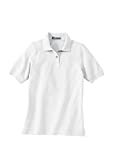

Product Title:  extreme womens 100 cotton piqué polo 75008 white 011 xl 
Euclidean Distance from input image: 1.168007747764932e-06
Amazon Url: www.amzon.com/dp/B00ELC56MK


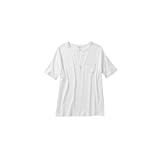

Product Title:  white stag maternity short sleeve henley wpocket white small 46 
Euclidean Distance from input image: 7.665091136831002
Amazon Url: www.amzon.com/dp/B01EXXFAP4


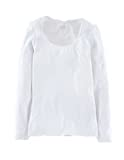

Product Title:  boden white long sleeve essential tee top tunic size 10 us 
Euclidean Distance from input image: 8.426335767553969
Amazon Url: www.amzon.com/dp/B071H7MJ9G


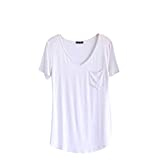

Product Title:  szhem womens modal loose short sleeve tops v neck pocket tshirt blouse 
Euclidean Distance from input image: 8.485708929919562
Amazon Url: www.amzon.com/dp/B01BEV6JNK


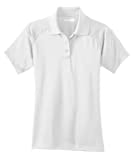

Product Title:  cornerstone red kap  ladies select snagproof tactical poloxxl white cs411 
Euclidean Distance from input image: 8.493374373339972
Amazon Url: www.amzon.com/dp/B00CIZFWLC


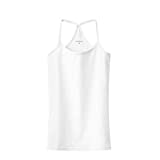

Product Title:  fashion womens camisole soft vest sexy skinny tank top 7 
Euclidean Distance from input image: 8.528376223468147
Amazon Url: www.amzon.com/dp/B074TTXWMV


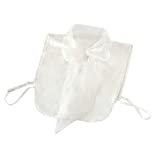

Product Title:  joyci fashion main cover organza white bowknot false fake collar office lady dickey 
Euclidean Distance from input image: 8.533560752868652
Amazon Url: www.amzon.com/dp/B019TP6P14


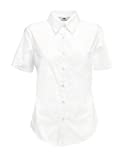

Product Title:  fruit loom womens fit poplin short sleeve shirt white xxl 
Euclidean Distance from input image: 8.564755373757402
Amazon Url: www.amzon.com/dp/B003AREPAG


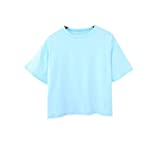

Product Title:  womens summer pastel candycolored tops tees sky blue 
Euclidean Distance from input image: 8.613897132873536
Amazon Url: www.amzon.com/dp/B01IM2S2S4


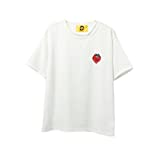

Product Title:  womens harajuku tops tees kawaii strawberry design white 
Euclidean Distance from input image: 8.623079802507466
Amazon Url: www.amzon.com/dp/B01L5MVXJ8


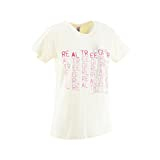

Product Title:  realtree girl short sleeve jumbled wind tshirt yellow size small pack 1 
Euclidean Distance from input image: 8.645905876159668
Amazon Url: www.amzon.com/dp/B074KQG7JS


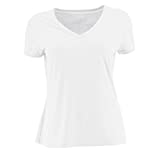

Product Title:  white sierra womens tahoe tee white 
Euclidean Distance from input image: 8.663608672136371
Amazon Url: www.amzon.com/dp/B00EVR2UM4


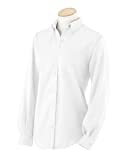

Product Title:  van heusen 59800 womens lsleeve wriresistant oxford  white  xlarge 
Euclidean Distance from input image: 8.66520855607923
Amazon Url: www.amzon.com/dp/B0057JH9UI


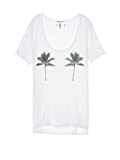

Product Title:  victorias secret pink new super soft scoop neck tee color triumph white xsmall relaxed fit 
Euclidean Distance from input image: 8.707658030504291
Amazon Url: www.amzon.com/dp/B071JQWPZF


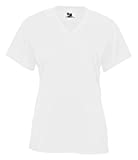

Product Title:  badger  ladies bcore vneck tee  4162  xl  white 
Euclidean Distance from input image: 8.7547031915652
Amazon Url: www.amzon.com/dp/B00DOL9FXU


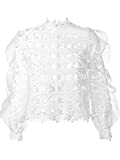

Product Title:  self portrait white lace flounce sleeve top 2 
Euclidean Distance from input image: 8.833453871630988
Amazon Url: www.amzon.com/dp/B071174JP9


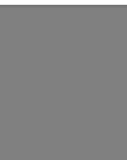

Product Title:  colortone t1000 spider adult tee  kelly  
Euclidean Distance from input image: 8.849701716327033
Amazon Url: www.amzon.com/dp/B00YEDRKFC


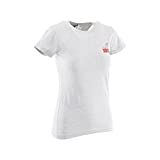

Product Title:  realtree girl fitted womens tee realtree apc camo heather small pack 1 
Euclidean Distance from input image: 8.857204723358155
Amazon Url: www.amzon.com/dp/B074KPGGMW


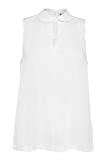

Product Title:  french connection womans white penny plains sleeveless peter pan collar blouse xs 
Euclidean Distance from input image: 8.864570287512466
Amazon Url: www.amzon.com/dp/B00TVGMDWM


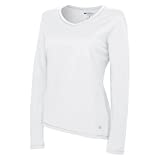

Product Title:  champion authentic womens jersey long sleeve tee 
Euclidean Distance from input image: 8.86625139894422
Amazon Url: www.amzon.com/dp/B071WJ8Z1P


In [24]:
# weight for title = 5
# weight for brand = 5
# weight for color = 5
# weight for image = 5

idf_w2v_brand_image(931,5,5,5,5,20)

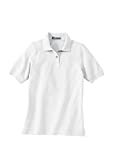

Product Title:  extreme womens 100 cotton piqué polo 75008 white 011 xl 
Euclidean Distance from input image: 1.5573436771605717e-06
Amazon Url: www.amzon.com/dp/B00ELC56MK


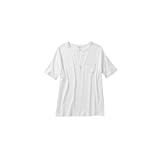

Product Title:  white stag maternity short sleeve henley wpocket white small 46 
Euclidean Distance from input image: 9.053292029976813
Amazon Url: www.amzon.com/dp/B01EXXFAP4


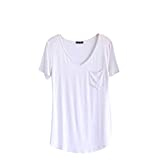

Product Title:  szhem womens modal loose short sleeve tops v neck pocket tshirt blouse 
Euclidean Distance from input image: 9.945086700325673
Amazon Url: www.amzon.com/dp/B01BEV6JNK


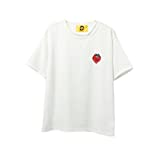

Product Title:  womens harajuku tops tees kawaii strawberry design white 
Euclidean Distance from input image: 10.239440750640354
Amazon Url: www.amzon.com/dp/B01L5MVXJ8


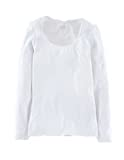

Product Title:  boden white long sleeve essential tee top tunic size 10 us 
Euclidean Distance from input image: 10.24212864765469
Amazon Url: www.amzon.com/dp/B071H7MJ9G


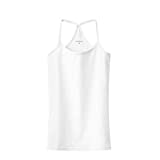

Product Title:  fashion womens camisole soft vest sexy skinny tank top 7 
Euclidean Distance from input image: 10.243230909347064
Amazon Url: www.amzon.com/dp/B074TTXWMV


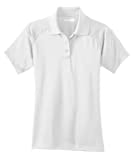

Product Title:  cornerstone red kap  ladies select snagproof tactical poloxxl white cs411 
Euclidean Distance from input image: 10.33752648169859
Amazon Url: www.amzon.com/dp/B00CIZFWLC


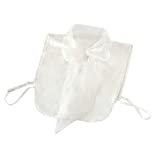

Product Title:  joyci fashion main cover organza white bowknot false fake collar office lady dickey 
Euclidean Distance from input image: 10.387493981255425
Amazon Url: www.amzon.com/dp/B019TP6P14


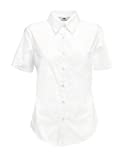

Product Title:  fruit loom womens fit poplin short sleeve shirt white xxl 
Euclidean Distance from input image: 10.417823626859201
Amazon Url: www.amzon.com/dp/B003AREPAG


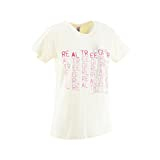

Product Title:  realtree girl short sleeve jumbled wind tshirt yellow size small pack 1 
Euclidean Distance from input image: 10.419237348768446
Amazon Url: www.amzon.com/dp/B074KQG7JS


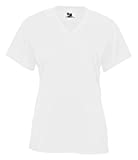

Product Title:  badger  ladies bcore vneck tee  4162  xl  white 
Euclidean Distance from input image: 10.51462787341243
Amazon Url: www.amzon.com/dp/B00DOL9FXU


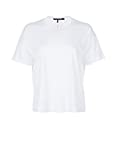

Product Title:  rag  bone white suzanne tee l 
Euclidean Distance from input image: 10.523791508780116
Amazon Url: www.amzon.com/dp/B06XC25WV7


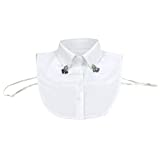

Product Title:  stylish clothing accessories womens shirt collar detachable neckband false collar 20 
Euclidean Distance from input image: 10.548603571361495
Amazon Url: www.amzon.com/dp/B01N1H1YJV


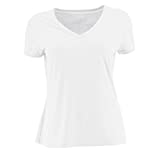

Product Title:  white sierra womens tahoe tee white 
Euclidean Distance from input image: 10.553750612565265
Amazon Url: www.amzon.com/dp/B00EVR2UM4


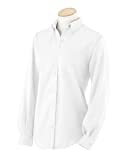

Product Title:  van heusen 59800 womens lsleeve wriresistant oxford  white  xlarge 
Euclidean Distance from input image: 10.568027752797823
Amazon Url: www.amzon.com/dp/B0057JH9UI


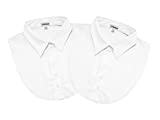

Product Title:  2pack white womens dickey collars usabased igotcollared aka dicky collar detachable fake blouse collar 
Euclidean Distance from input image: 10.627440480789094
Amazon Url: www.amzon.com/dp/B01N9JYI2N


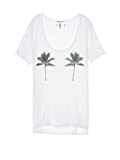

Product Title:  victorias secret pink new super soft scoop neck tee color triumph white xsmall relaxed fit 
Euclidean Distance from input image: 10.630122194031376
Amazon Url: www.amzon.com/dp/B071JQWPZF


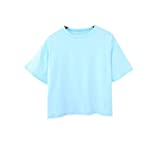

Product Title:  womens summer pastel candycolored tops tees sky blue 
Euclidean Distance from input image: 10.634432333487052
Amazon Url: www.amzon.com/dp/B01IM2S2S4


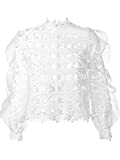

Product Title:  self portrait white lace flounce sleeve top 2 
Euclidean Distance from input image: 10.682531683913998
Amazon Url: www.amzon.com/dp/B071174JP9


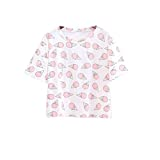

Product Title:  womens kawaii cotton pastel tops tees pink ice cream design 
Euclidean Distance from input image: 10.702556108501767
Amazon Url: www.amzon.com/dp/B06XG3LBFC


In [25]:
# weight for title = 5
# weight for brand = 8
# weight for color = 5
# weight for image = 9

idf_w2v_brand_image(931,5,8,5,9,20)

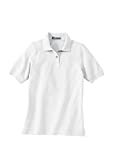

Product Title:  extreme womens 100 cotton piqué polo 75008 white 011 xl 
Euclidean Distance from input image: 1.2888361605542617e-06
Amazon Url: www.amzon.com/dp/B00ELC56MK


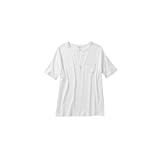

Product Title:  white stag maternity short sleeve henley wpocket white small 46 
Euclidean Distance from input image: 7.9181637766944535
Amazon Url: www.amzon.com/dp/B01EXXFAP4


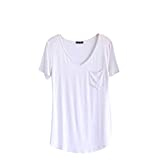

Product Title:  szhem womens modal loose short sleeve tops v neck pocket tshirt blouse 
Euclidean Distance from input image: 8.649918726177088
Amazon Url: www.amzon.com/dp/B01BEV6JNK


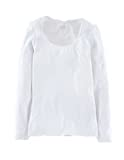

Product Title:  boden white long sleeve essential tee top tunic size 10 us 
Euclidean Distance from input image: 8.828620072777765
Amazon Url: www.amzon.com/dp/B071H7MJ9G


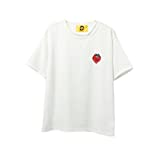

Product Title:  womens harajuku tops tees kawaii strawberry design white 
Euclidean Distance from input image: 8.83874468872559
Amazon Url: www.amzon.com/dp/B01L5MVXJ8


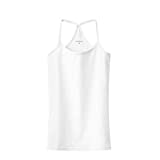

Product Title:  fashion womens camisole soft vest sexy skinny tank top 7 
Euclidean Distance from input image: 8.863152153843236
Amazon Url: www.amzon.com/dp/B074TTXWMV


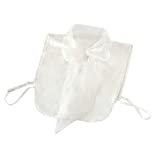

Product Title:  joyci fashion main cover organza white bowknot false fake collar office lady dickey 
Euclidean Distance from input image: 8.914294933450632
Amazon Url: www.amzon.com/dp/B019TP6P14


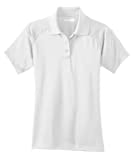

Product Title:  cornerstone red kap  ladies select snagproof tactical poloxxl white cs411 
Euclidean Distance from input image: 8.922961542628762
Amazon Url: www.amzon.com/dp/B00CIZFWLC


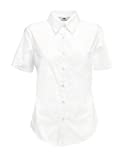

Product Title:  fruit loom womens fit poplin short sleeve shirt white xxl 
Euclidean Distance from input image: 9.009928626928652
Amazon Url: www.amzon.com/dp/B003AREPAG


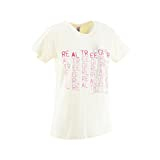

Product Title:  realtree girl short sleeve jumbled wind tshirt yellow size small pack 1 
Euclidean Distance from input image: 9.024795926850418
Amazon Url: www.amzon.com/dp/B074KQG7JS


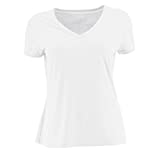

Product Title:  white sierra womens tahoe tee white 
Euclidean Distance from input image: 9.065207480431544
Amazon Url: www.amzon.com/dp/B00EVR2UM4


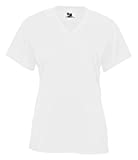

Product Title:  badger  ladies bcore vneck tee  4162  xl  white 
Euclidean Distance from input image: 9.075514514579691
Amazon Url: www.amzon.com/dp/B00DOL9FXU


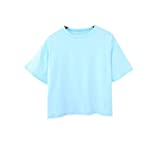

Product Title:  womens summer pastel candycolored tops tees sky blue 
Euclidean Distance from input image: 9.100577124233904
Amazon Url: www.amzon.com/dp/B01IM2S2S4


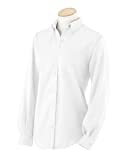

Product Title:  van heusen 59800 womens lsleeve wriresistant oxford  white  xlarge 
Euclidean Distance from input image: 9.11585150647578
Amazon Url: www.amzon.com/dp/B0057JH9UI


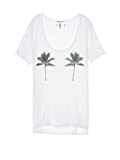

Product Title:  victorias secret pink new super soft scoop neck tee color triumph white xsmall relaxed fit 
Euclidean Distance from input image: 9.126130234653493
Amazon Url: www.amzon.com/dp/B071JQWPZF


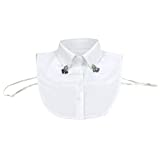

Product Title:  stylish clothing accessories womens shirt collar detachable neckband false collar 20 
Euclidean Distance from input image: 9.145918232923751
Amazon Url: www.amzon.com/dp/B01N1H1YJV


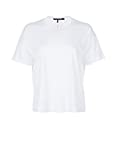

Product Title:  rag  bone white suzanne tee l 
Euclidean Distance from input image: 9.14733822109556
Amazon Url: www.amzon.com/dp/B06XC25WV7


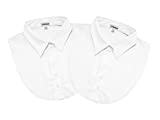

Product Title:  2pack white womens dickey collars usabased igotcollared aka dicky collar detachable fake blouse collar 
Euclidean Distance from input image: 9.17978663350985
Amazon Url: www.amzon.com/dp/B01N9JYI2N


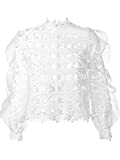

Product Title:  self portrait white lace flounce sleeve top 2 
Euclidean Distance from input image: 9.224814782253663
Amazon Url: www.amzon.com/dp/B071174JP9


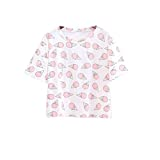

Product Title:  womens kawaii cotton pastel tops tees pink ice cream design 
Euclidean Distance from input image: 9.231061426411252
Amazon Url: www.amzon.com/dp/B06XG3LBFC


In [26]:
# weight for title = 5
# weight for brand = 9
# weight for color = 7
# weight for image = 8

idf_w2v_brand_image(931,5,9,7,8,20)

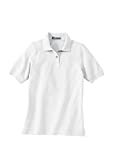

Product Title:  extreme womens 100 cotton piqué polo 75008 white 011 xl 
Euclidean Distance from input image: 1.2112673344004347e-06
Amazon Url: www.amzon.com/dp/B00ELC56MK


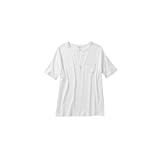

Product Title:  white stag maternity short sleeve henley wpocket white small 46 
Euclidean Distance from input image: 8.098760791829742
Amazon Url: www.amzon.com/dp/B01EXXFAP4


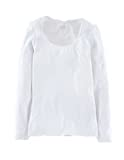

Product Title:  boden white long sleeve essential tee top tunic size 10 us 
Euclidean Distance from input image: 8.882090673925992
Amazon Url: www.amzon.com/dp/B071H7MJ9G


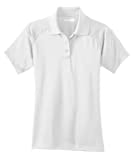

Product Title:  cornerstone red kap  ladies select snagproof tactical poloxxl white cs411 
Euclidean Distance from input image: 8.923794408924811
Amazon Url: www.amzon.com/dp/B00CIZFWLC


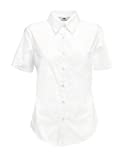

Product Title:  fruit loom womens fit poplin short sleeve shirt white xxl 
Euclidean Distance from input image: 8.974066198540992
Amazon Url: www.amzon.com/dp/B003AREPAG


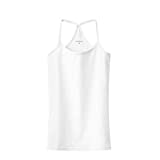

Product Title:  fashion womens camisole soft vest sexy skinny tank top 7 
Euclidean Distance from input image: 9.030575838639438
Amazon Url: www.amzon.com/dp/B074TTXWMV


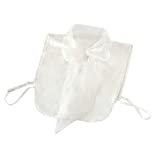

Product Title:  joyci fashion main cover organza white bowknot false fake collar office lady dickey 
Euclidean Distance from input image: 9.048615349663628
Amazon Url: www.amzon.com/dp/B019TP6P14


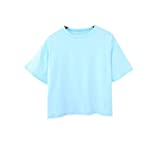

Product Title:  womens summer pastel candycolored tops tees sky blue 
Euclidean Distance from input image: 9.062015674732349
Amazon Url: www.amzon.com/dp/B01IM2S2S4


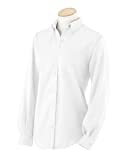

Product Title:  van heusen 59800 womens lsleeve wriresistant oxford  white  xlarge 
Euclidean Distance from input image: 9.096336736961177
Amazon Url: www.amzon.com/dp/B0057JH9UI


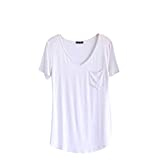

Product Title:  szhem womens modal loose short sleeve tops v neck pocket tshirt blouse 
Euclidean Distance from input image: 9.101992944010512
Amazon Url: www.amzon.com/dp/B01BEV6JNK


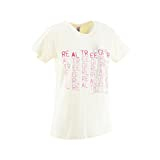

Product Title:  realtree girl short sleeve jumbled wind tshirt yellow size small pack 1 
Euclidean Distance from input image: 9.113035837809244
Amazon Url: www.amzon.com/dp/B074KQG7JS


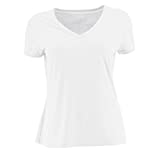

Product Title:  white sierra womens tahoe tee white 
Euclidean Distance from input image: 9.165837780290543
Amazon Url: www.amzon.com/dp/B00EVR2UM4


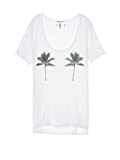

Product Title:  victorias secret pink new super soft scoop neck tee color triumph white xsmall relaxed fit 
Euclidean Distance from input image: 9.20269821097269
Amazon Url: www.amzon.com/dp/B071JQWPZF


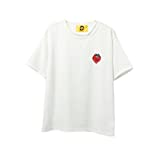

Product Title:  womens harajuku tops tees kawaii strawberry design white 
Euclidean Distance from input image: 9.253942876047923
Amazon Url: www.amzon.com/dp/B01L5MVXJ8


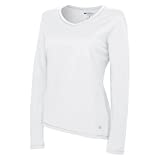

Product Title:  champion authentic womens jersey long sleeve tee 
Euclidean Distance from input image: 9.2984783541921
Amazon Url: www.amzon.com/dp/B071WJ8Z1P


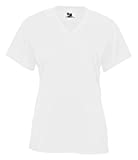

Product Title:  badger  ladies bcore vneck tee  4162  xl  white 
Euclidean Distance from input image: 9.305281603197548
Amazon Url: www.amzon.com/dp/B00DOL9FXU


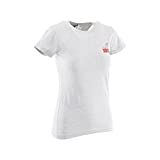

Product Title:  realtree girl fitted womens tee realtree apc camo heather small pack 1 
Euclidean Distance from input image: 9.315303661205151
Amazon Url: www.amzon.com/dp/B074KPGGMW


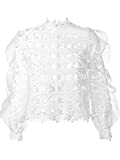

Product Title:  self portrait white lace flounce sleeve top 2 
Euclidean Distance from input image: 9.32572536249467
Amazon Url: www.amzon.com/dp/B071174JP9


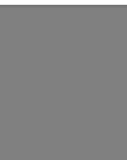

Product Title:  colortone t1000 spider adult tee  kelly  
Euclidean Distance from input image: 9.352199361518107
Amazon Url: www.amzon.com/dp/B00YEDRKFC


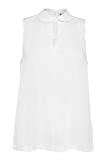

Product Title:  french connection womans white penny plains sleeveless peter pan collar blouse xs 
Euclidean Distance from input image: 9.352394385993772
Amazon Url: www.amzon.com/dp/B00TVGMDWM


In [27]:
# weight for title = 9
# weight for brand = 5
# weight for color = 6
# weight for image = 7

idf_w2v_brand_image(931,9,5,6,7,20)

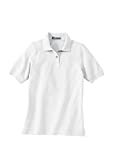

Product Title:  extreme womens 100 cotton piqué polo 75008 white 011 xl 
Euclidean Distance from input image: 8.342912484035228e-07
Amazon Url: www.amzon.com/dp/B00ELC56MK


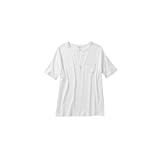

Product Title:  white stag maternity short sleeve henley wpocket white small 46 
Euclidean Distance from input image: 6.528793775700616
Amazon Url: www.amzon.com/dp/B01EXXFAP4


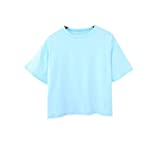

Product Title:  womens summer pastel candycolored tops tees sky blue 
Euclidean Distance from input image: 6.901734488351004
Amazon Url: www.amzon.com/dp/B01IM2S2S4


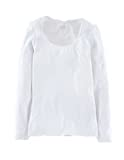

Product Title:  boden white long sleeve essential tee top tunic size 10 us 
Euclidean Distance from input image: 6.9144743751240725
Amazon Url: www.amzon.com/dp/B071H7MJ9G


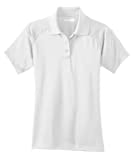

Product Title:  cornerstone red kap  ladies select snagproof tactical poloxxl white cs411 
Euclidean Distance from input image: 6.94699063193376
Amazon Url: www.amzon.com/dp/B00CIZFWLC


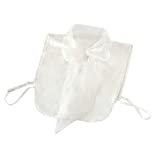

Product Title:  joyci fashion main cover organza white bowknot false fake collar office lady dickey 
Euclidean Distance from input image: 6.979180744716099
Amazon Url: www.amzon.com/dp/B019TP6P14


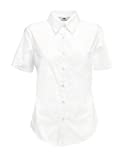

Product Title:  fruit loom womens fit poplin short sleeve shirt white xxl 
Euclidean Distance from input image: 7.0218929385512245
Amazon Url: www.amzon.com/dp/B003AREPAG


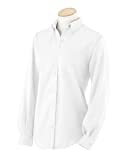

Product Title:  van heusen 59800 womens lsleeve wriresistant oxford  white  xlarge 
Euclidean Distance from input image: 7.077959964547385
Amazon Url: www.amzon.com/dp/B0057JH9UI


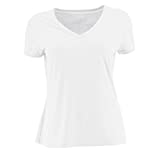

Product Title:  white sierra womens tahoe tee white 
Euclidean Distance from input image: 7.088527684259316
Amazon Url: www.amzon.com/dp/B00EVR2UM4


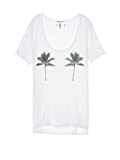

Product Title:  victorias secret pink new super soft scoop neck tee color triumph white xsmall relaxed fit 
Euclidean Distance from input image: 7.102982389633897
Amazon Url: www.amzon.com/dp/B071JQWPZF


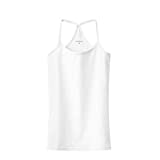

Product Title:  fashion womens camisole soft vest sexy skinny tank top 7 
Euclidean Distance from input image: 7.107922764109751
Amazon Url: www.amzon.com/dp/B074TTXWMV


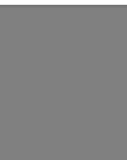

Product Title:  colortone t1000 spider adult tee  kelly  
Euclidean Distance from input image: 7.119918773446311
Amazon Url: www.amzon.com/dp/B00YEDRKFC


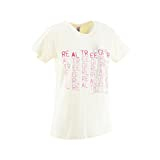

Product Title:  realtree girl short sleeve jumbled wind tshirt yellow size small pack 1 
Euclidean Distance from input image: 7.173261778695243
Amazon Url: www.amzon.com/dp/B074KQG7JS


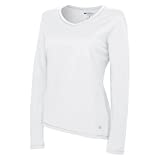

Product Title:  champion authentic womens jersey long sleeve tee 
Euclidean Distance from input image: 7.190181261075431
Amazon Url: www.amzon.com/dp/B071WJ8Z1P


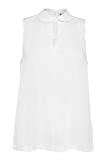

Product Title:  french connection womans white penny plains sleeveless peter pan collar blouse xs 
Euclidean Distance from input image: 7.258045765548529
Amazon Url: www.amzon.com/dp/B00TVGMDWM


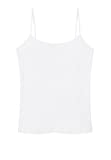

Product Title:  violeta mango womens plus size spaghetti strap top white 
Euclidean Distance from input image: 7.267614252443408
Amazon Url: www.amzon.com/dp/B073JDM3WY


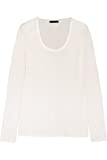

Product Title:  row baxerton white jersey tshirt 
Euclidean Distance from input image: 7.28380805105355
Amazon Url: www.amzon.com/dp/B074TZWLNY


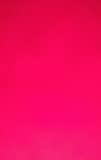

Product Title:  almost famous top embellished flag print w fringe hem charcoal gray 
Euclidean Distance from input image: 7.2838494677667205
Amazon Url: www.amzon.com/dp/B06XPKYWTZ


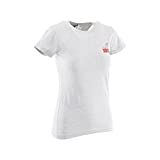

Product Title:  realtree girl fitted womens tee realtree apc camo heather small pack 1 
Euclidean Distance from input image: 7.291679927280971
Amazon Url: www.amzon.com/dp/B074KPGGMW


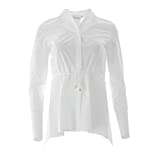

Product Title:  max mara womens curve tie waist button shirt sz 2 white 
Euclidean Distance from input image: 7.291868147454129
Amazon Url: www.amzon.com/dp/B06WWJQ3P2


In [28]:
# weight for title = 9
# weight for brand = 5
# weight for color = 9
# weight for image = 5

idf_w2v_brand_image(931,9,5,9,5,20)